# <font face="Arial" size="6">An Analysis of Long-Term Country Specific Economic Growth Data</font>

## <font face="Arial" size="5">Identifying Influential Factors and Determining the Best Quantifiers of "Growth"</font>

### <font face="Arial" size="4">Sam Virsik</font>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import xlrd
from sklearn.linear_model import LinearRegression
import math

# Data Importing, Preparation, Reformatting

#### Trade Data

In [2]:
dft = pd.read_csv('Data\CountryTradeFull.csv') #trade data

dft.dropna()
dft.drop(columns=['series_type', 'table_type', 'table_type_desc', 'country_code', 'period_type', 'period', 'period_in_date', 
                  'commodity_group_code', 'commodity_group_name', 'partner_country_code', 'partner_country_english_name', 
                  'base_year', 'currency_type', 'value_unit', 'value_type', 'value_type_desc', 'estimation_type_desc', 
                  'period_number', 'estimation_type'], inplace=True)

dft = dft[dft['country_type'] == 'C']
dft = dft[dft['trade_flow'] != 'CA']
dft.drop(columns=['country_type'], inplace=True)

In [3]:
dft2 = dft.pivot_table(index=['country_english_name', 'year'], columns='trade_flow_desc', values='value', aggfunc='sum').reset_index()

# Calculate import export gap
dft2['Exports-Imports'] = dft2['Exports'] - dft2['Imports']

# Stack the DataFrame to add 'Imports', 'Exports', and 'Exports-Imports' as separate rows
dft2 = dft2.melt(id_vars=['country_english_name', 'year'], value_vars=['Imports', 'Exports', 'Exports-Imports'], var_name='trade_flow_desc', value_name='value')

# Sort the DataFrame
dft2 = dft2.sort_values(by=['country_english_name', 'year', 'trade_flow_desc']).reset_index(drop=True)

In [154]:
dft2.head()

,country_english_name,year,trade_flow_desc,value
0,Afghanistan,1946,Exports,47.82
1,Afghanistan,1946,Exports-Imports,-2.18
2,Afghanistan,1946,Imports,50.00
3,Afghanistan,1947,Exports,49.70
4,Afghanistan,1947,Exports-Imports,-3.10


In [4]:
pivot_df = dft2.pivot_table(index=['country_english_name', 'trade_flow_desc'],
                          columns='year',
                          values='value',
                          aggfunc='sum')

# Reset index to make 'country_english_name' and 'trade_flow_desc' regular columns
pivot_df.reset_index(inplace=True)

pivot_df.columns.name = None

pivot_df.rename(columns={'trade_flow_desc': 'info_type'}, inplace=True)
pivot_df.rename(columns={'country_english_name': 'country'}, inplace=True)


pivot_df.head()

,country,info_type,1946,1947,1948,1949,1950,1951,1952,1953,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Afghanistan,Exports,47.82,49.7,49.0,47.0,53.0,60.0,45.0,47.0,...,373.958198,414.759212,571.404991,596.455338,831.859248,875.181037,863.833322,776.722236,734.684908,656.341619
1,Afghanistan,Exports-Imports,-2.18,-3.1,-9.0,-5.0,-7.0,5.0,-15.0,-18.0,...,-8194.712672,-7292.380726,-7158.841628,-5946.230356,-6970.603934,-6531.324868,-5912.264396,-5760.887151,-4426.132204,-4291.047507
2,Afghanistan,Imports,50.00,52.8,58.0,52.0,60.0,55.0,60.0,65.0,...,8568.670870,7707.139938,7730.246619,6542.685694,7802.463182,7406.505905,6776.097718,6537.609387,5160.817112,4947.389126
3,Albania,Exports,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2431.647360,2540.783704,2013.095653,1961.477334,2463.201513,3099.404234,2985.007867,2716.277582,3681.100753,4310.142456
4,Albania,Exports-Imports,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-2499.774279,-2742.656836,-2352.378033,-2704.611767,-3207.291324,-3306.815585,-3498.071548,-3306.407332,-4418.438853,-4090.777913


#### Country Health Data

In [5]:
dfg = pd.read_excel('Data\GDP_cap_data.xlsx', sheet_name = "Full data") #trade data

dfg_gdp = dfg.drop(columns=['countrycode', "pop"])
dfg_pop = dfg.drop(columns=['countrycode', "gdppc"])

# REFORMATTING AND COMBINING

dfg_gdp = dfg_gdp.pivot_table(index='country', columns='year', values='gdppc', aggfunc='first')
dfg_gdp.reset_index(inplace=True)
dfg_gdp.fillna(np.nan, inplace=True)
dfg_gdp['info_type'] = 'GDP Per Capita'

dfg_pop = dfg_pop.pivot_table(index='country', columns='year', values='pop', aggfunc='first')
dfg_pop.reset_index(inplace=True)
dfg_pop.fillna(np.nan, inplace=True)
dfg_pop['info_type'] = 'Population'

numerical_columns = dfg_pop.select_dtypes(include='number').columns
dfg_pop[numerical_columns] *= 1000 #This is because the database formatted population values in the 1000s

dfg = pd.concat([dfg_gdp, dfg_pop], ignore_index=True)

dfg = dfg.sort_values(by='country')

dfg

year,country,1,730,1000,1090,1120,1252,1253,1254,1255,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,info_type
0,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.627672e+03,1792.00,1.945000e+03,2.025000e+03,2.022000e+03,1.928000e+03,1.929000e+03,2.014745e+03,1.934555e+03,GDP Per Capita
169,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.912100e+07,29758000.00,3.042000e+07,3.110800e+07,3.182300e+07,3.256400e+07,3.333200e+07,3.412481e+07,3.494084e+07,Population
170,Albania,200000.0,NaN,200000.0,NaN,NaN,NaN,NaN,NaN,NaN,...,2.992340e+06,3000068.60,3.008275e+06,3.016837e+06,3.025657e+06,3.034742e+06,3.044075e+06,3.053485e+06,3.062734e+06,Population
1,Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.222973e+03,9484.00,9.592000e+03,9.660000e+03,9.808000e+03,1.003200e+04,1.034200e+04,1.070212e+04,1.110417e+04,GDP Per Capita
2,Algeria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.258774e+04,13204.00,1.337900e+04,1.349400e+04,1.374400e+04,1.400400e+04,1.433100e+04,1.426723e+04,1.422802e+04,GDP Per Capita
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,Yemen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.812345e+03,4088.00,4.077000e+03,4.165000e+03,4.054000e+03,2.844000e+03,2.506000e+03,2.321924e+03,2.284890e+03,GDP Per Capita
336,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.368394e+07,14085497.07,1.449772e+07,1.492240e+07,1.535917e+07,1.580799e+07,1.627431e+07,1.675831e+07,1.725468e+07,Population
167,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.032068e+03,3205.00,3.350000e+03,3.419000e+03,3.478000e+03,3.478000e+03,3.479000e+03,3.497582e+03,3.534034e+03,GDP Per Capita
168,Zimbabwe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.401857e+03,1515.00,1.604000e+03,1.604000e+03,1.594000e+03,1.560000e+03,1.534000e+03,1.582366e+03,1.611405e+03,GDP Per Capita


In [6]:
df_final = pd.concat([dfg, pivot_df], ignore_index=True)
df_final = df_final.sort_values(by='country')

df_final.reset_index(drop=True, inplace=True)

df_final = df_final[['country', 'info_type'] + [col for col in df_final.columns if col not in ['country', 'info_type']]]


df_final.head()

,country,info_type,1,730,1000,1090,1120,1252,1253,1254,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Afghanistan,GDP Per Capita,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.025000e+03,2.022000e+03,1.928000e+03,1.929000e+03,2.014745e+03,1.934555e+03,NaN,NaN,NaN,NaN
1,Afghanistan,Imports,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.568671e+03,7.707140e+03,7.730247e+03,6.542686e+03,7.802463e+03,7.406506e+03,6776.097718,6537.609387,5160.817112,4947.389126
2,Afghanistan,Exports-Imports,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-8.194713e+03,-7.292381e+03,-7.158842e+03,-5.946230e+03,-6.970604e+03,-6.531325e+03,-5912.264396,-5760.887151,-4426.132204,-4291.047507
3,Afghanistan,Exports,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.739582e+02,4.147592e+02,5.714050e+02,5.964553e+02,8.318592e+02,8.751810e+02,863.833322,776.722236,734.684908,656.341619
4,Afghanistan,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.110800e+07,3.182300e+07,3.256400e+07,3.333200e+07,3.412481e+07,3.494084e+07,NaN,NaN,NaN,NaN


In [7]:
dfh = pd.read_excel('Data\Data_1_country_health.xlsx', sheet_name = "Data") #trade data
dfh.dropna()
dfh.drop(columns=['Country Code', 'Series Code'], inplace=True)
dfh = dfh.dropna(subset=['Country Name'])
dfh = dfh[dfh['Country Name'] != "Data from database: Population estimates and projections"]
dfh = dfh[dfh['Country Name'] != "Last Updated: 12/20/2023"]

for column_name in dfh.columns:
    dfh[column_name] = dfh[column_name].replace('..', pd.NA)

columns = dfh.columns

# Define a function to extract only the year from the column name
def extract_year(column_name):
    return column_name.split()[0]

# Rename the columns
new_columns = [extract_year(col) if '[' in col else col for col in columns]
dfh.columns = new_columns
dfh=dfh.rename(columns={'Series Name': 'info_type'})
dfh=dfh.rename(columns={'Country Name': 'country'})

dfh

,country,info_type,1960,1961,1962,1963,1964,1965,1966,1967,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Afghanistan,"Death rate, crude (per 1,000 people)",31.921,31.349,30.845,30.359,29.867,29.389,28.872,28.396,...,7.931,7.711,7.478,7.395,7.331,7.077,7.027,6.981,6.791,7.113
1,Afghanistan,"Life expectancy at birth, total (years)",32.535,33.068,33.547,34.016,34.494,34.953,35.453,35.924,...,61.419,61.923,62.417,62.545,62.659,63.136,63.016,63.081,63.565,62.575
2,Afghanistan,Net migration,2606,6109,7016,6681,7079,10695,3563,6824,...,418796,105905,48076,255611,-281739,-90238,-47090,-47205,-8082,166821
3,Afghanistan,Population ages 0-14 (% of total population),41.627186,41.695303,41.769167,41.885377,42.059389,42.314133,42.620141,42.918797,...,48.26436,47.43249,46.867621,46.231538,45.792106,45.520967,45.118616,44.708445,44.291352,43.807912
4,Afghanistan,"Birth rate, crude (per 1,000 people)",50.34,50.443,50.57,50.703,50.831,50.872,50.986,51.081,...,39.855,40.009,39.601,39.105,38.803,37.936,37.342,36.927,36.466,36.051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2123,Zimbabwe,Population ages 0-14 (% of total population),47.315655,47.663873,48.052887,48.509669,48.733595,48.674055,48.60495,48.550049,...,43.383758,43.453948,43.37044,43.172363,42.872671,42.517883,42.152298,41.798795,41.468973,41.156085
2124,Zimbabwe,"Birth rate, crude (per 1,000 people)",47.26,47.039,46.867,46.611,46.398,46.246,46.058,45.949,...,37.205,36.804,36.246,35.122,33.96,33.171,32.516,32.074,31.518,31.009
2125,Zimbabwe,Population growth (annual %),<NA>,3.094865,3.10532,3.115408,3.119878,3.124829,3.129628,3.135761,...,1.438339,1.822309,2.163267,2.191391,2.136294,2.081806,2.04362,2.020537,1.989253,2.031112
2126,Zimbabwe,Rural population,3326410,3422606,3519986,3610652,3702920,3796976,3892679,3990069,...,8725322,8909792,9129035,9352079,9570861,9785059,9995789,10204026,10408889,10617452


In [8]:
df_final.columns = df_final.columns.astype(str)
dfh.columns = dfh.columns.astype(str)

df_final = pd.concat([df_final, dfh], ignore_index=True)
df_final = df_final.sort_values(by='country')

df_final.reset_index(drop=True, inplace=True)

df_final = df_final[['country', 'info_type'] + [col for col in df_final.columns if col not in ['country', 'info_type']]]

df_final = df_final.dropna(how='all')

df_final.head(15)

,country,info_type,1,730,1000,1090,1120,1252,1253,1254,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Afghanistan,GDP Per Capita,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2025.0,2022.0,1928.0,1929.0,2014.7453,1934.555,NaN,NaN,NaN,NaN
1,Afghanistan,Net migration,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48076,255611,-281739,-90238,-47090,-47205,-8082,166821,NaN,NaN
2,Afghanistan,Population ages 0-14 (% of total population),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,46.867621,46.231538,45.792106,45.520967,45.118616,44.708445,44.291352,43.807912,NaN,NaN
3,Afghanistan,"Birth rate, crude (per 1,000 people)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.601,39.105,38.803,37.936,37.342,36.927,36.466,36.051,NaN,NaN
4,Afghanistan,Population growth (annual %),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.466788,3.657576,3.121341,2.581549,2.866492,2.885208,2.908529,3.134747,NaN,NaN
5,Afghanistan,Rural population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,23853670,24672275,25381619,25970228,26643455,27333488,28042342,28829317,NaN,NaN
6,Afghanistan,Urban population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7687539,8043935,8371880,8665979,8999963,9353296,9727157,10142913,NaN,NaN
7,Afghanistan,"Life expectancy at birth, total (years)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,62.417,62.545,62.659,63.136,63.016,63.081,63.565,62.575,NaN,NaN
8,Afghanistan,"Death rate, crude (per 1,000 people)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7.478,7.395,7.331,7.077,7.027,6.981,6.791,7.113,NaN,NaN
9,Afghanistan,Imports,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8568.67087,7707.139938,7730.246619,6542.685694,7802.463182,7406.505905,6776.097718,6537.609387,5160.817112,4947.389126


#### Country Economic Data

In [9]:
dfgdp = pd.read_excel('Data\GDP Data.xlsx', sheet_name = "Data") 
dfgdp.dropna()
dfgdp = dfgdp[dfgdp['Series Name'] != "Data from database: World Development Indicators"]
dfgdp = dfgdp[dfgdp['Series Name'] != "Last Updated: 02/21/2024"]
dfgdp = dfgdp.dropna(subset=['Series Name'])
dfgdp.drop(columns=['Series Code', 'Country Code'], inplace=True)
for column_name in dfgdp.columns:
    dfgdp[column_name] = dfgdp[column_name].replace('..', pd.NA)

columns = dfgdp.columns
def extract_year(column_name):
    return column_name.split()[0]
new_columns = [extract_year(col) if '[' in col else col for col in columns]
dfgdp.columns = new_columns

In [10]:
dfgdp = dfgdp.replace('<NA>', pd.NA)
dfgdp.columns = dfgdp.columns.astype(str)
dfgdp=dfgdp.rename(columns={'Series Name': 'info_type'})
dfgdp=dfgdp.rename(columns={'Country Name': 'country'})

In [11]:
df_final = pd.concat([df_final, dfgdp], ignore_index=True)
df_final = df_final.sort_values(by='country')

df_final.reset_index(drop=True, inplace=True)

df_final = df_final[['country', 'info_type'] + [col for col in df_final.columns if col not in ['country', 'info_type']]]

df_final = df_final.dropna(how='all')

df_final.head(25)

,country,info_type,1,730,1000,1090,1120,1252,1253,1254,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Afghanistan,GDP Per Capita,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2025.0,2022.0,1928.0,1929.0,2014.7453,1934.555,NaN,NaN,NaN,NaN
1,Afghanistan,Gross capital formation (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,11.5,NaN,NaN
2,Afghanistan,GNI per capita (constant LCU),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,35922.650719,NaN,NaN
3,Afghanistan,GNI growth (annual %),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,NaN,NaN
4,Afghanistan,GNI (current LCU),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1142367404506.379883,1180059297651.830078,1230123226794.97998,1238705988898.699951,1299739212632.919922,1345435708479.709961,1491579730999.459961,1546444266548.540039,NaN,NaN
5,Afghanistan,GNI (constant 2015 US$),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,<NA>,<NA>,19249499539.065083,<NA>,<NA>,<NA>,<NA>,<NA>,NaN,NaN
6,Afghanistan,GDP per person employed (constant 2017 PPP $),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9410.201084,9195.148331,9062.646088,9081.993512,9089.063831,9203.982637,9581.857567,9541.770957,NaN,NaN
7,Afghanistan,"GDP, PPP (current international $)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,65039839448.556061,69058343420.160202,71831696727.808594,70097956089.287659,74711922906.37384,77417896456.450806,81889326057.207352,81007485782.960449,NaN,NaN
8,Afghanistan,"GDP per capita, PPP (constant 2017 internation...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2165.340915,2144.449634,2108.714173,2101.422187,2096.093111,2060.698973,2079.921861,1968.341002,NaN,NaN
9,Afghanistan,GDP per capita (constant LCU),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39225.878612,38847.426029,38200.066145,38067.969362,37971.431359,37330.254657,37678.483737,35657.158957,NaN,NaN


In [12]:
df_final

,country,info_type,1,730,1000,1090,1120,1252,1253,1254,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Afghanistan,GDP Per Capita,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2025.0,2022.0,1928.0,1929.0,2014.7453,1934.555,NaN,NaN,NaN,NaN
1,Afghanistan,Gross capital formation (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,11.5,NaN,NaN
2,Afghanistan,GNI per capita (constant LCU),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,35922.650719,NaN,NaN
3,Afghanistan,GNI growth (annual %),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,NaN,NaN
4,Afghanistan,GNI (current LCU),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1142367404506.379883,1180059297651.830078,1230123226794.97998,1238705988898.699951,1299739212632.919922,1345435708479.709961,1491579730999.459961,1546444266548.540039,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,Zimbabwe,GDP (constant 2015 US$),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,19280916546.448841,19567149970.420227,19963120600,20142979412.317272,20964866130.333355,22015177994.760704,20621078642.743515,19009139108.244747,NaN,NaN
9013,Zimbabwe,Adjusted net national income per capita (const...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1014.06954,994.498535,1088.188448,1052.198912,1078.130522,1324.885161,1199.555347,1060.895626,NaN,NaN
9014,Zimbabwe,GDP per capita (constant LCU),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,14635.117719,14530.448796,14511.158213,14340.232354,14623.429797,15048.883152,13818.287765,12482.003408,NaN,NaN
9015,Zimbabwe,GDP Per Capita,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1604.0,1594.0,1560.0,1534.0,1582.3662,1611.4052,NaN,NaN,NaN,NaN


# Data Visualization

In [173]:
def make_single_graph(country, info_type_1, info_type_2, df_final):
    data_set_1 = df_final[(df_final['country'] == country) & (df_final['info_type'] == info_type_1)]
    data_set_1 = data_set_1.iloc[:, 2:].values.flatten().tolist()

    data_set_2 = df_final[(df_final['country'] == country) & (df_final['info_type'] == info_type_2)]
    data_set_1 = data_set_2.iloc[:, 2:].values.flatten().tolist()

    if len(data_set_1) == len(data_set_2):
        # Plot exports vs. GDP per capita
        plt.figure(figsize=(10, 6))
        plt.scatter(data_set_1, data_set_2)
        plt.title(info_type_1 + " vs " + info_type_2 + " for " + country)
        plt.xlabel(info_type_1)
        plt.ylabel(info_type_2)
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    else:
        print("Sorry, we don't have data for both of those metrics for this country.")

In [174]:
def make_multi_graph(country, info_type_1, info_type_2s, df_final):
    num_subplots = len(info_type_2s)
    num_rows = (num_subplots + 1) // 2  # Calculate number of rows needed for subplots

    fig, axes = plt.subplots(num_rows, 2, figsize=(14, 6 * num_rows))

    for i, info_type_2 in enumerate(info_type_2s):
        row = i // 2
        col = i % 2

        data_set_1 = df_final[(df_final['country'] == country) & (df_final['info_type'] == info_type_1)]
        data_set_1 = data_set_1.iloc[:, 2:].values.flatten().tolist()

        data_set_2 = df_final[(df_final['country'] == country) & (df_final['info_type'] == info_type_2)]
        data_set_2 = data_set_2.iloc[:, 2:].values.flatten().tolist()

        while np.nan in data_set_1:
            nan_index = data_set_1.index(np.nan)  # Get index of the first np.nan occurrence
            del data_set_1[nan_index]  # Remove np.nan from list1
            del data_set_2[nan_index]
        while np.nan in data_set_2:
            nan_index = data_set_2.index(np.nan)  # Get index of the first np.nan occurrence
            del data_set_2[nan_index]  # Remove np.nan from list1
            del data_set_1[nan_index]
        print(type(data_set_1[0]))
        print(data_set_1)
        print(data_set_2)

        if len(data_set_1) == len(data_set_2):
            # Create a subplot for each combination of info_type_1 and info_type_2
            ax = axes[row, col] if num_subplots > 1 else axes
            ax.scatter(data_set_1, data_set_2)
            ax.set_title(info_type_1 + " vs " + info_type_2 + " for " + country)
            ax.set_xlabel(info_type_1)
            ax.set_ylabel(info_type_2)
            ax.grid(True)

        else:
            print("Sorry, we don't have data for both of those metrics for this country.")

    plt.tight_layout()
    plt.show()

In [175]:
desired_country = "United States"
info_type_1 = "GDP Per Capita"
info_type_2 = "Population"

make_single_graph(desired_country, info_type_1, info_type_2, df_final)

Sorry, we don't have data for both of those metrics for this country.


<class 'float'>
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan

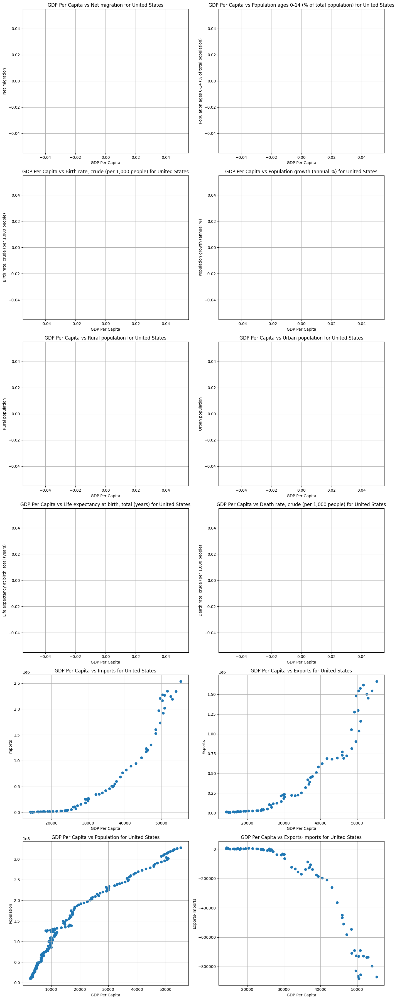

In [41]:
desired_country = "United States"
info_type_1 = "GDP Per Capita"

info_type_2 = df_final["info_type"].unique().tolist()

make_multi_graph(desired_country, info_type_1, [x for x in info_type_2 if x != info_type_1], df_final)

# Data Modeling

### Determining Best Predictors for Custom Parameters

In [12]:
def grab_country_data(df_final, desired_country):
    df = df_final[(df_final['country'] == desired_country)]
    df = df.drop(columns=['country'])

    df = pd.melt(df, id_vars=['info_type'], var_name='year', value_name='value')
    df = df.pivot_table(index='year', columns='info_type', values='value', aggfunc='first').reset_index()


    #df.dropna(inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    return df

In [13]:
def correlate_matrix(df):
    cor=df.corr()
    sns.heatmap(cor, annot=True)

In [145]:
def remove_corresponding_nulls(x, y):
    y_name = y.name
    x["new"] = y
    x=x.dropna()
    y=x['new']
    y.name = y_name
    x = x.drop(columns=['new'])
    return(x, y)

    '''
    train_data = pd.concat([x, y], axis=1)
    print(train_data.head(20))

    target_column_name = y.name
    print(target_column_name)

    # Drop rows with missing values in both X_train and y_train
    train_data.dropna(subset=x.columns.append(pd.Index([target_column_name])), inplace=True)

    # Separate X_train and y_train again
    x = train_data.drop(columns=[target_column_name])  # Replace 'target_column_name' with the actual name of your target column
    y = train_data[target_column_name]

    return(x, y)

    rows_with_null = x[x.isnull().any(axis=1)]
    indexes_to_drop = rows_with_null.index.tolist()
    x = x.drop(indexes_to_drop)

    # Drop corresponding indexes from other_list
    y = [y[i] for i in range(len(y)) if i not in indexes_to_drop]

    print(y)
    print(x)
    indexes_to_remove = []
    for i in range(len(x)):
        if x[i].isna():
            indexes_to_remove.append(i)
    for i in range(len(y)):
        if y[i].isna():
            indexes_to_remove.append(i)
    print(indexes_to_remove)
    indexes_to_remove = list(set(indexes_to_remove)).sort(reverse=True)
    for i in indexes_to_remove:
        del x[i]
        del y[i]
    '''
    return x, y

In [158]:
def backward_select(selected_features, var, df):
    y_train = df[var]

    # Initialize the model
    model = LinearRegression()

    # Perform backward selection
    while len(selected_features) > 1:
        # Train and calculate initial score
        X_train = df[selected_features]
        X_train, y_train = remove_corresponding_nulls(X_train, y_train)
        if len(y_train) != 0:
            # Train the model
            model = model.fit(X_train, y_train)
            initial_score = model.score(X_train, y_train)
        else:
            initial_score = 0

        #print("Features:", selected_features, "Score:", initial_score)

        worst_feature = None
        worst_score_diff = 1
        
        for feature in selected_features:
            # Create a new model without the current feature
            X_temp = X_train.drop(feature, axis=1)
            
            
            # Fit the model on the training data
            X_train, y_train = remove_corresponding_nulls(X_temp, y_train)
            
            if len(y_train) != 0:
                # Train the model
                model = model.fit(X_temp, y_train)
                score = model.score(X_temp, y_train) 
            else:
                score = initial_score


            # Find the difference in the scores
            score_diff = initial_score - score

            #print("Feature:", feature, "Score Diff:", score_diff, "Score:", score)
            
            # Update the worst feature if the current feature worsens the score
            if score_diff < worst_score_diff:
                worst_score_diff = score_diff
                worst_feature = feature
        
        # Remove the worst feature from the list of selected features
        selected_features.remove(worst_feature)
        #print("Removed Feature:", worst_feature)

    # Print final feature score
    X_train = df[selected_features]
    X_train, y_train = remove_corresponding_nulls(X_train, y_train)
    if len(y_train) != 0:
        # Train the model
        model = model.fit(X_train, y_train)
        initial_score = model.score(X_train, y_train)
    else:
        initial_score =0

    #print("Features:", selected_features, "Score:", initial_score)
    return (selected_features[0], initial_score)

In [15]:
def find_best_predictors(var, prohibited_predictors):
    best_features = []
    feature_scores = {}

    for i in df_final['country'].unique().tolist():
        df = grab_country_data(df_final, i)
        if var in list(df.columns):
            if var not in prohibited_predictors:
                selected_features = list(df.columns)
                selected_features = [x for x in selected_features if x != var]
                best_feature, score = backward_select(selected_features, var, df)

                if best_feature not in feature_scores:
                    feature_scores[best_feature]=[score]
                else:
                    feature_scores[best_feature].append(score)
                best_features.append(best_feature)
    print(best_features)
    print(feature_scores)
    return (best_features, feature_scores)


In [16]:
def hist_of_best_predictors(best_features):
    frequency = {}

    # Count the frequency of each string value
    for item in best_features:
        if item in frequency:
            frequency[item] += 1
        else:
            frequency[item] = 1

    # Extract labels and counts from the frequency dictionary
    labels = list(frequency.keys())
    counts = list(frequency.values())

    # Create a bar plot
    plt.figure(figsize=(6, 4))
    plt.bar(labels, counts)
    plt.title('Frequency of Best Predictors')
    plt.xlabel('Predictors')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.grid(axis='y')  # Add gridlines along the y-axis
    plt.show()

In [17]:
def display_average_best_predictors(feature_scores):
    averages = {}

    for key, value_list in feature_scores.items():
        avg = sum(value_list) / len(value_list)
        averages[key] = avg

    # Print the averages
    for key, avg in averages.items():
        print(f"Average of {key}: {avg}")

In [18]:
def hist_of_predictor_frequencies(feature_scores):
    num_subplots = len(feature_scores)

    # Create subplots
    fig, axs = plt.subplots(1, num_subplots, figsize=(10, 5))

    # Loop through the dictionary and create a histogram for each list of values
    for i, (key, value_list) in enumerate(feature_scores.items()):
        axs[i].hist(value_list, bins=10, color='skyblue', edgecolor='black')  # Adjust bins as needed
        axs[i].set_title(f'{key}')
        axs[i].set_xlabel('Values')
        axs[i].set_ylabel('Frequency')
        axs[i].grid(True)

    # Adjust layout
    plt.tight_layout()
    plt.show()

In [19]:
df_final['info_type'].unique()

array(['GDP Per Capita', 'Net migration',
       'Population ages 0-14 (% of total population)',
       'Birth rate, crude (per 1,000 people)',
       'Population growth (annual %)', 'Rural population',
       'Urban population', 'Life expectancy at birth, total (years)',
       'Death rate, crude (per 1,000 people)', 'Imports', 'Exports',
       'Population', 'Exports-Imports'], dtype=object)

C:\Users\SamV\AppData\Local\Temp\ipykernel_5620\2157971438.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x["new"] = y
C:\Users\SamV\AppData\Local\Temp\ipykernel_5620\2157971438.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x["new"] = y
C:\Users\SamV\AppData\Local\Temp\ipykernel_5620\2157971438.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

['Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Population', 'Popu

C:\Users\SamV\AppData\Local\Temp\ipykernel_5620\2157971438.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x["new"] = y
C:\Users\SamV\AppData\Local\Temp\ipykernel_5620\2157971438.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x["new"] = y


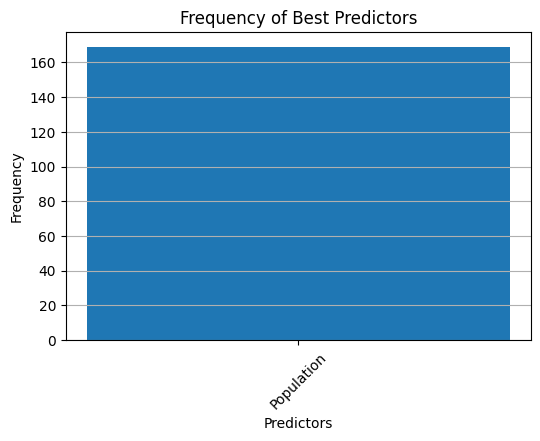

Average of Population: 0.6966533717676228


TypeError: 'Axes' object is not subscriptable

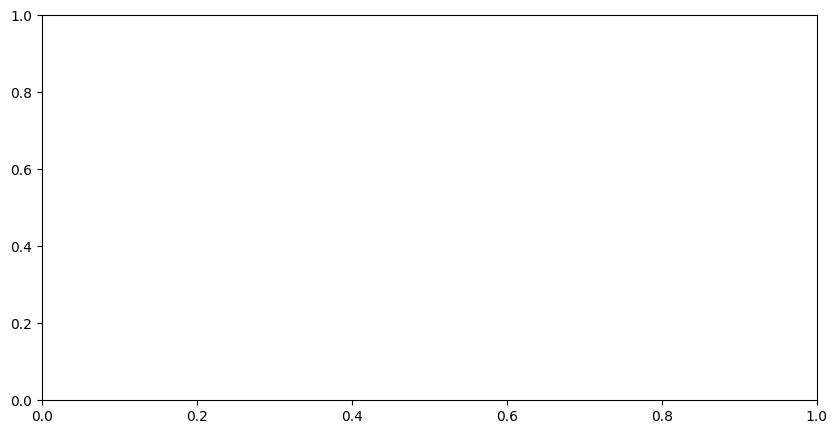

In [159]:
var = "GDP Per Capita"
prohibited_predictors = ["year"]

best_features, feature_scores = find_best_predictors(var, prohibited_predictors)
hist_of_best_predictors(best_features)
display_average_best_predictors(feature_scores)
hist_of_predictor_frequencies(feature_scores)

### Individual Predictor Analysis

In [12]:
def grab_country_data(df_final, desired_country):
    df = df_final[(df_final['country'] == desired_country)]
    df = df.drop(columns=['country'])

    df = pd.melt(df, id_vars=['info_type'], var_name='year', value_name='value')
    df = df.pivot_table(index='year', columns='info_type', values='value', aggfunc='first').reset_index()


    #df.dropna(inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    return df

In [13]:
def remove_nulls_1col(x, y):

    y_name = y.name
    #x.loc[:, "new"] = y
    y_list = y.tolist()
    #x["new"] = y_list
    x = x.assign(new = y_list)
    x=x.dropna()
    y=x["new"]
    y.name = y_name
    x = x.drop(columns=["new"])
    return(x, y)

In [14]:
def simple_model(X_train, y_train):
    '''
    model = LinearRegression()
    X_train, y_train = remove_nulls_1col(X_train, y_train)
    model = model.fit(X_train, y_train)
    return(model.score(X_train, y_train))
    '''
    # Create the model
    model = LinearRegression()

    X_train, y_train = remove_nulls_1col(X_train, y_train)

    if len(y_train) != 0:
        # Train the model
        model = model.fit(X_train, y_train)
        return(model.score(X_train, y_train))
    else:
        return(0)

In [15]:
def run_predictor_finder(df_final, predictors, indicators):

    total_prediction_data = {}
    for indicator in indicators: 
        r_squared_data = {}
        for c in df_final['country'].unique().tolist():
            df = grab_country_data(df_final, c)
            if indicator in list(df.columns):
                for predictor in predictors: 
                    if predictor in list(df.columns):
                        if predictor != indicator:
                            X_train = df[[predictor]]
                            y_train = df[indicator]
                            score = simple_model(X_train, y_train)
                            if predictor not in r_squared_data:
                                r_squared_data[predictor]=[score]
                            else:
                                r_squared_data[predictor].append(score)
        total_prediction_data[indicator] = r_squared_data
    return(total_prediction_data)
                            
'''
    possible_vars = df_final["info_type"].unique().tolist()
    for variable in possible_vars:
        r_squared_data = {}
        for c in df_final['country'].unique().tolist():
            df = grab_country_data(df_final, c)
            if variable in list(df.columns): # if we can actually do this category for this one
                for var in possible_vars:
                    if var in list(df.columns):
                        if var != variable: #Otherwise 100% correlation every time
                            X_train = df[[var]]
                            y_train = df[variable]

                            score = simple_model(X_train, y_train)

                            if var not in r_squared_data:
                                r_squared_data[var]=[score]
                            else:
                                r_squared_data[var].append(score)
        total_prediction_data[variable] = r_squared_data
    return(total_prediction_data)
'''

'\n    possible_vars = df_final["info_type"].unique().tolist()\n    for variable in possible_vars:\n        r_squared_data = {}\n        for c in df_final[\'country\'].unique().tolist():\n            df = grab_country_data(df_final, c)\n            if variable in list(df.columns): # if we can actually do this category for this one\n                for var in possible_vars:\n                    if var in list(df.columns):\n                        if var != variable: #Otherwise 100% correlation every time\n                            X_train = df[[var]]\n                            y_train = df[variable]\n\n                            score = simple_model(X_train, y_train)\n\n                            if var not in r_squared_data:\n                                r_squared_data[var]=[score]\n                            else:\n                                r_squared_data[var].append(score)\n        total_prediction_data[variable] = r_squared_data\n    return(total_prediction_data)\n'

In [16]:
predictors = ['Exports', 'Exports-Imports', 'Imports', 'Labor force, total', 'Net migration', 'Population', 'Urban population', 'Rural population', 'GDP Per Capita']
indicators = ['GDP Per Capita', r'Gross capital formation (% of GDP)',
       'GDP per capita (constant LCU)', 'GDP growth (annual %)',
       'GDP (current LCU)', 'GDP (constant 2015 US$)',
       'Consumer price index (2010 = 100)', 'CO2 emissions (kt)',
       'Labor force, total',
       'Death rate, crude (per 1,000 people)',
       'Life expectancy at birth, total (years)', 'Population',
       'Birth rate, crude (per 1,000 people)',
       r'Population ages 0-14 (% of total population)']


prediction_data = run_predictor_finder(df_final, predictors, indicators)

c:\Users\SamV\Documents\School\Senior Year\Econ\Data Analysis Project\Econ Code folder\.venv\lib\site-packages\sklearn\metrics\_regression.py:1187: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
c:\Users\SamV\Documents\School\Senior Year\Econ\Data Analysis Project\Econ Code folder\.venv\lib\site-packages\sklearn\metrics\_regression.py:1187: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
c:\Users\SamV\Documents\School\Senior Year\Econ\Data Analysis Project\Econ Code folder\.venv\lib\site-packages\sklearn\metrics\_regression.py:1187: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
c:\Users\SamV\Documents\School\Senior Year\Econ\Data Analysis Project\Econ Code folder\.venv\lib\site-packages\sklearn\metrics\_regression.py:1187: UndefinedMetricWarning: R^2

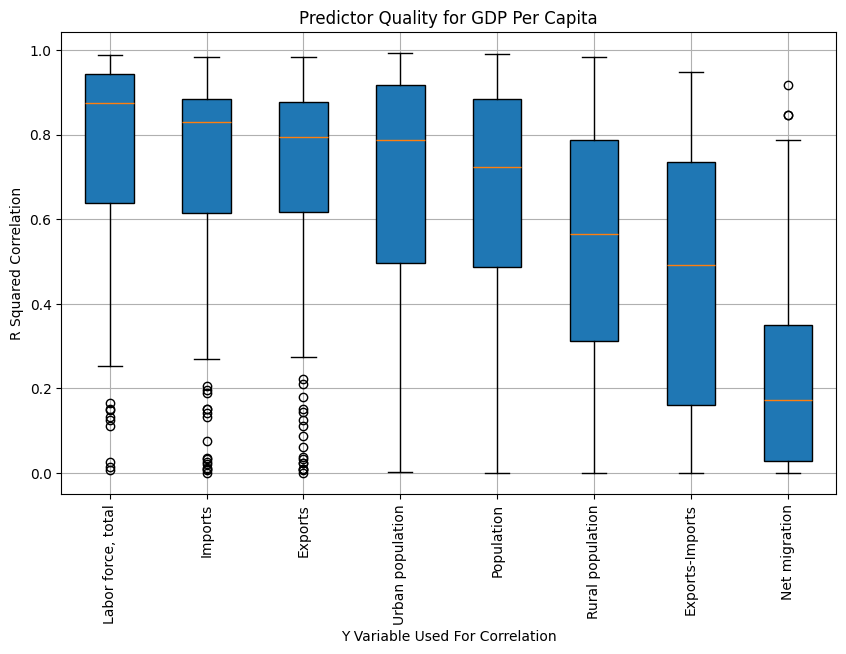

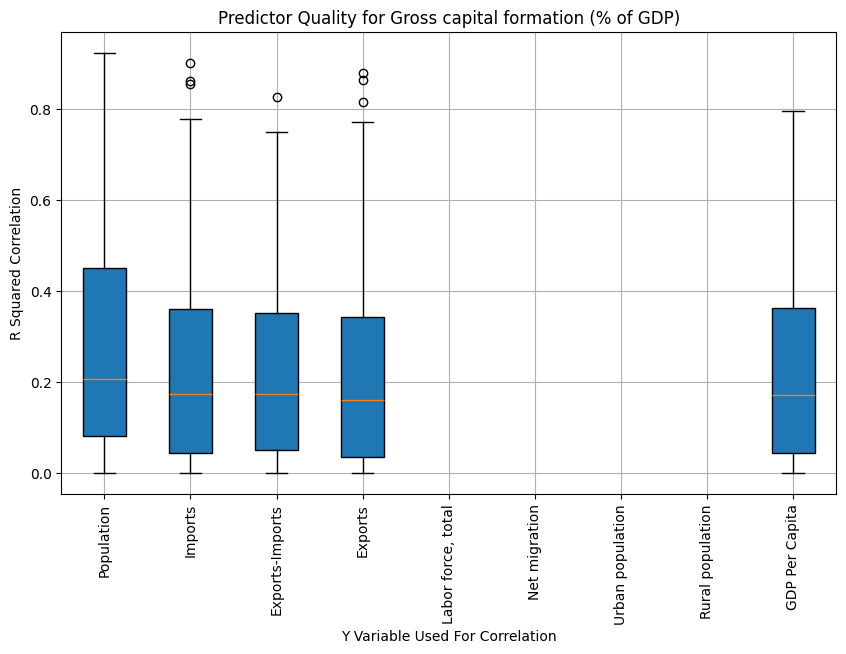

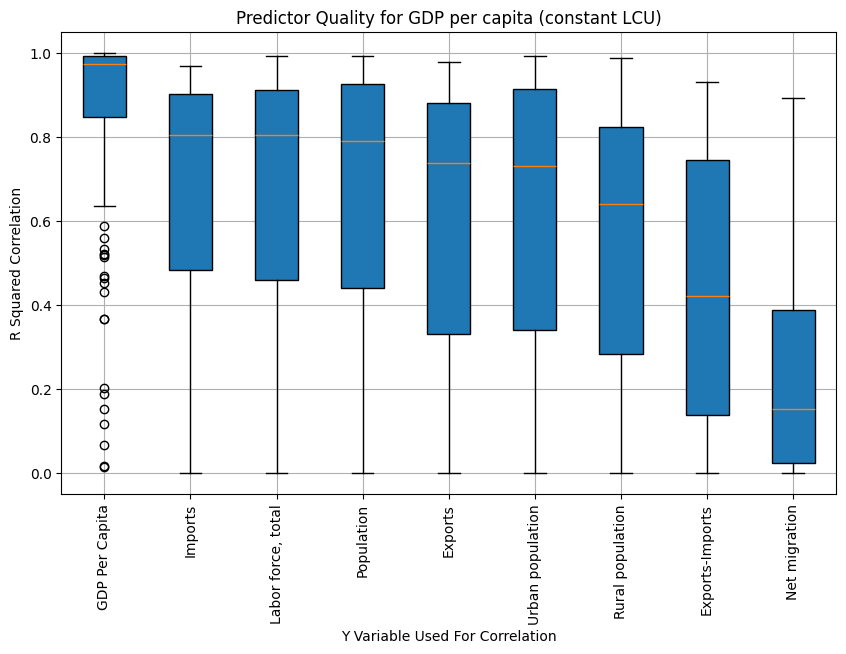

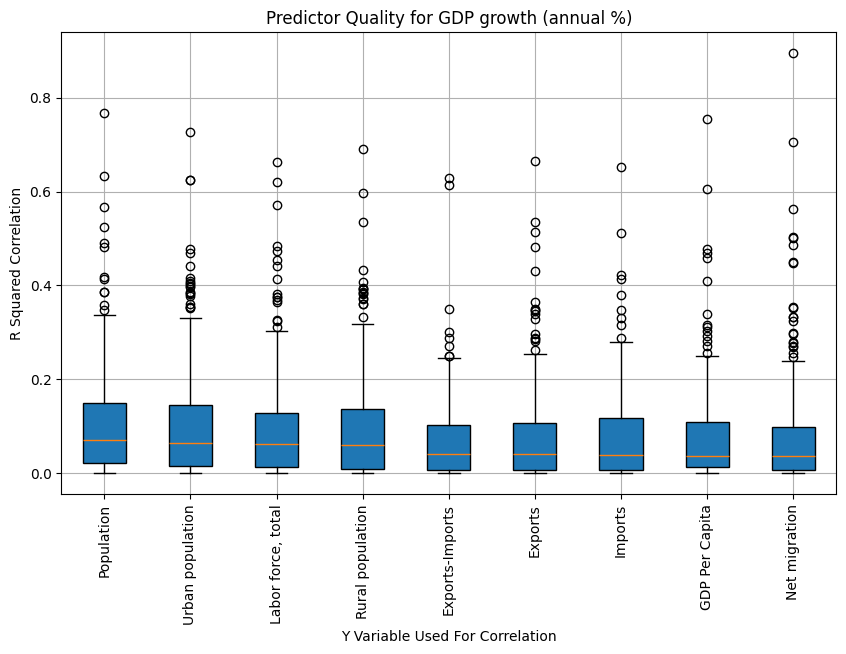

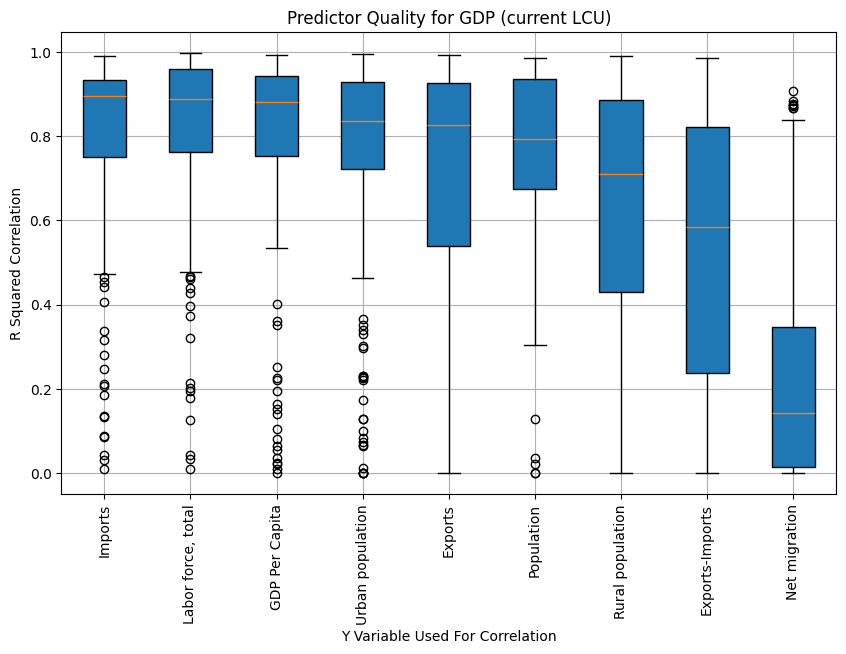

...

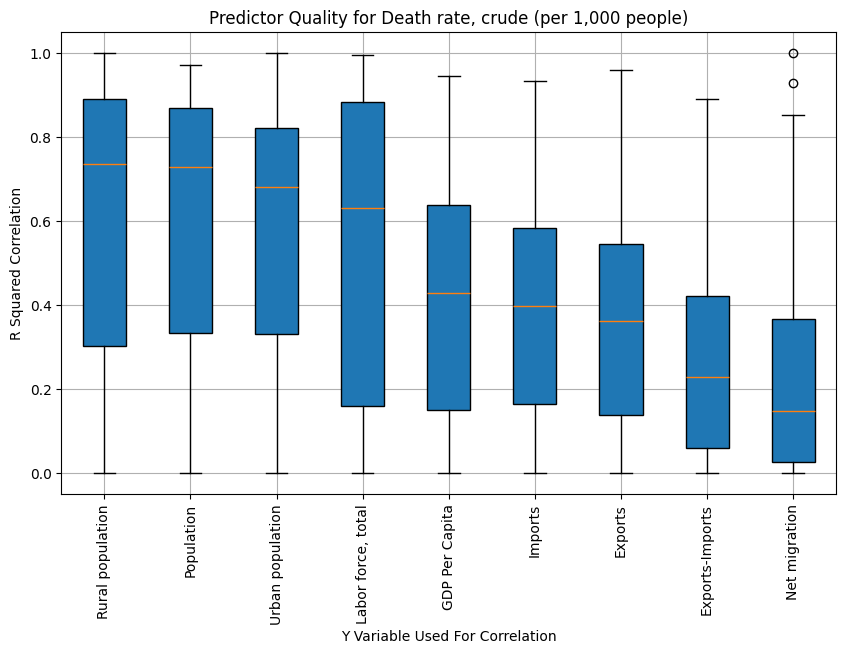

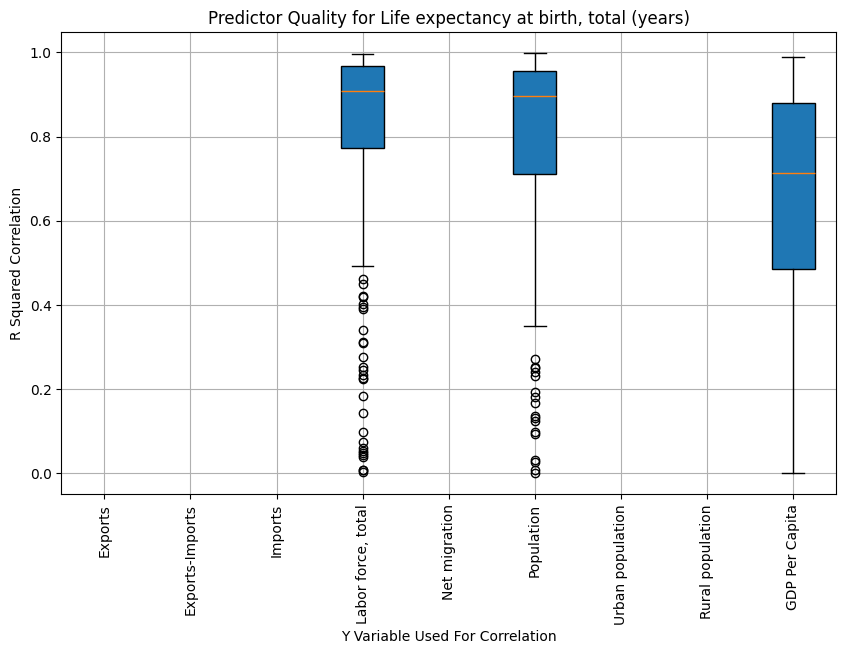

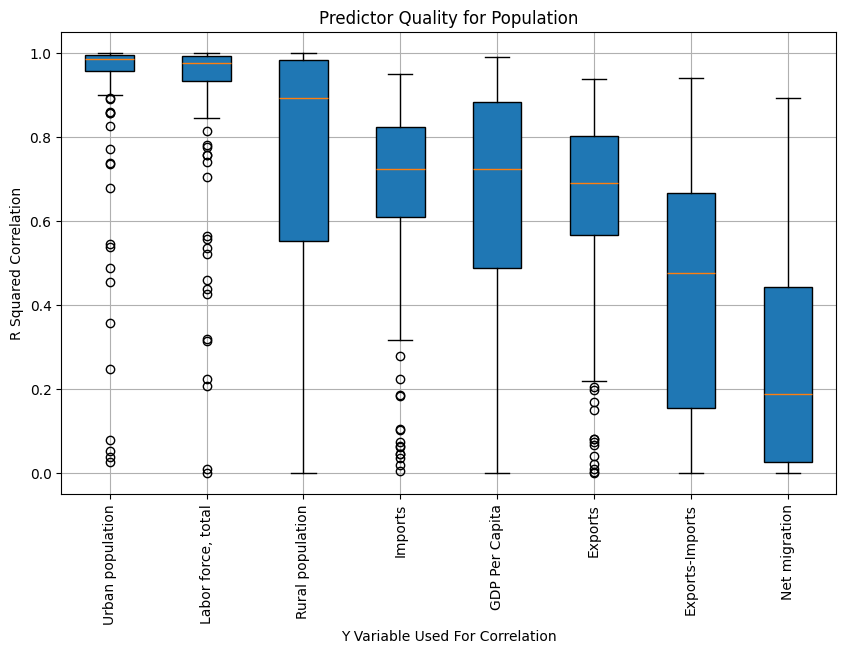

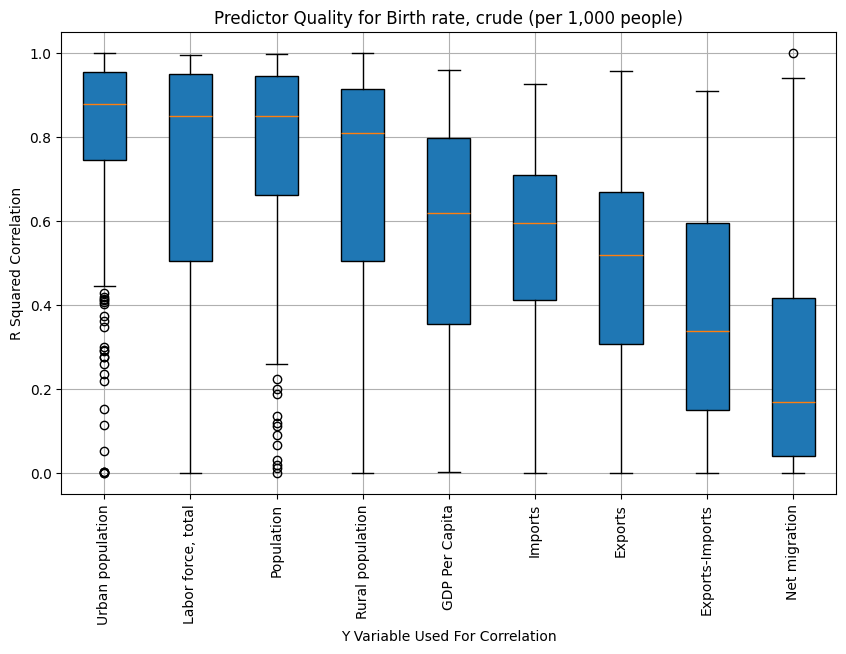

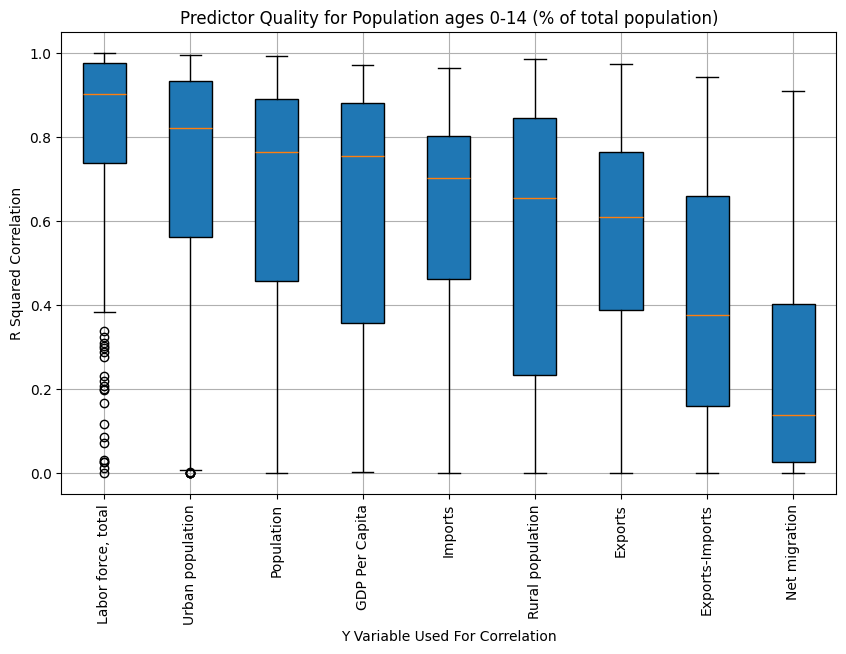

In [18]:
for outer_var, inner_dict in prediction_data.items():
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    plt.title(f'Predictor Quality for {outer_var}')

    # Sort inner dictionary items based on median values
    sorted_inner_dict = dict(sorted(inner_dict.items(), key=lambda x: -np.median(x[1])))

    # Initialize position counter
    position = 1

    # Loop through the sorted subdictionaries
    for inner_var, values in sorted_inner_dict.items():
        plt.boxplot(values, positions=[position], widths=0.5, patch_artist=True)
        position += 1  # Increment position for the next boxplot

    # Customize x-axis ticks and labels
    plt.xticks(range(1, len(sorted_inner_dict) + 1), sorted_inner_dict.keys(), rotation=90)
    plt.ylabel('R Squared Correlation')
    plt.xlabel('Y Variable Used For Correlation')

    # Add grid for better readability
    plt.grid(True)

    # Show plot
    plt.show()

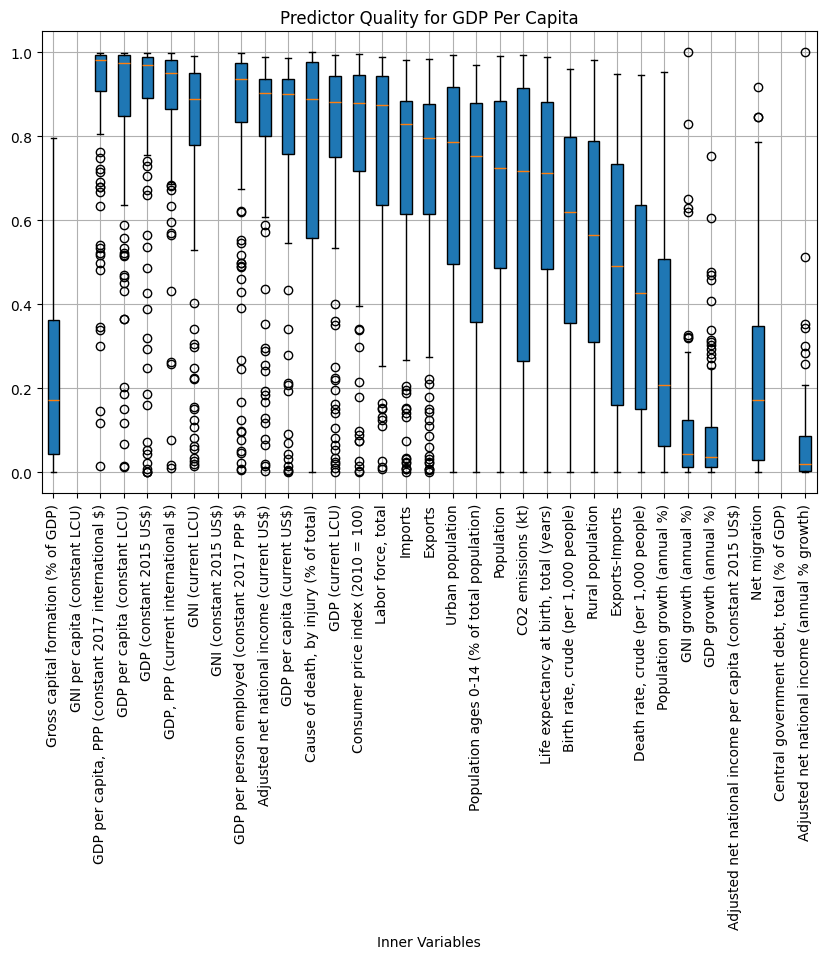

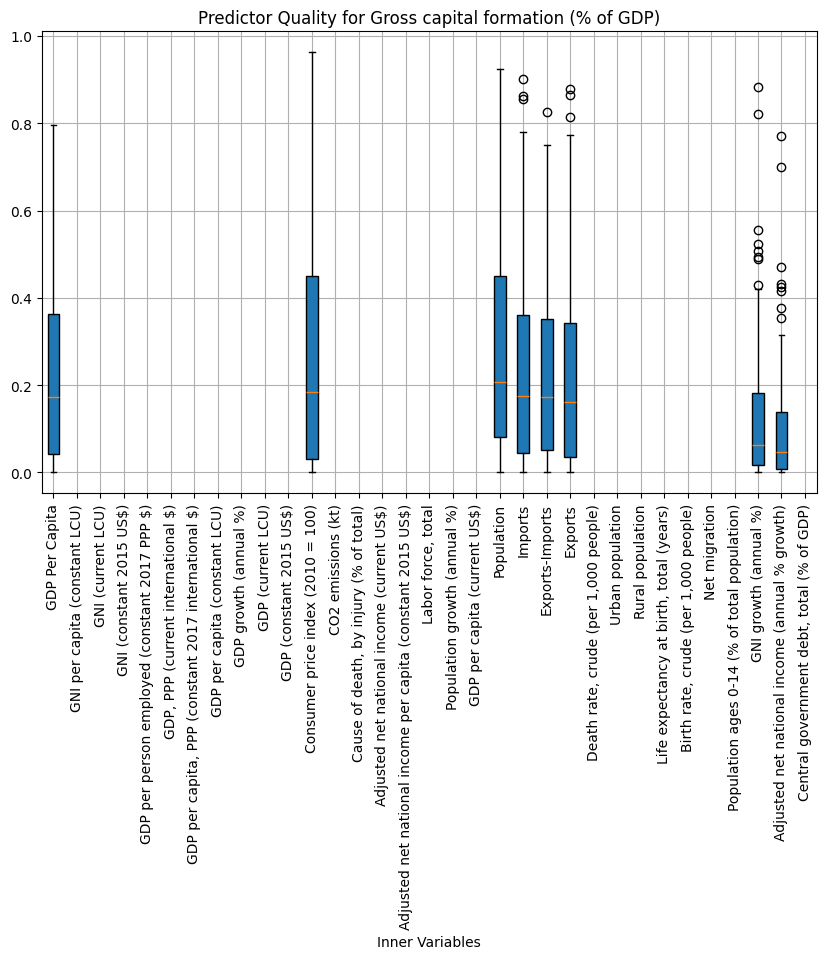

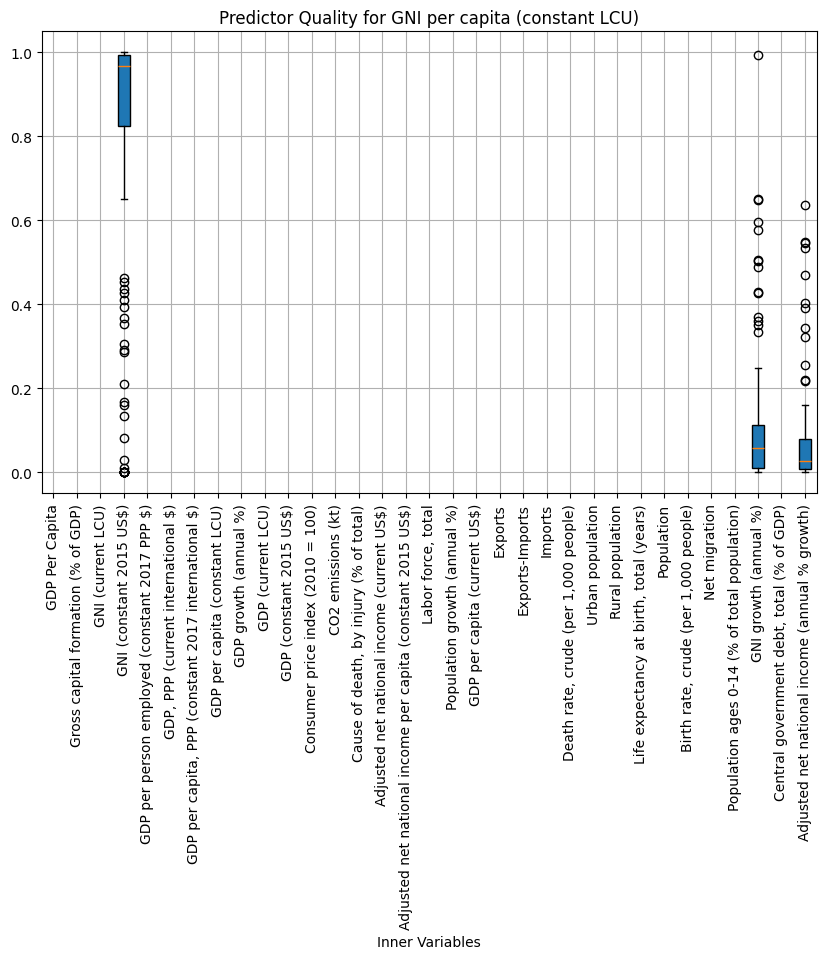

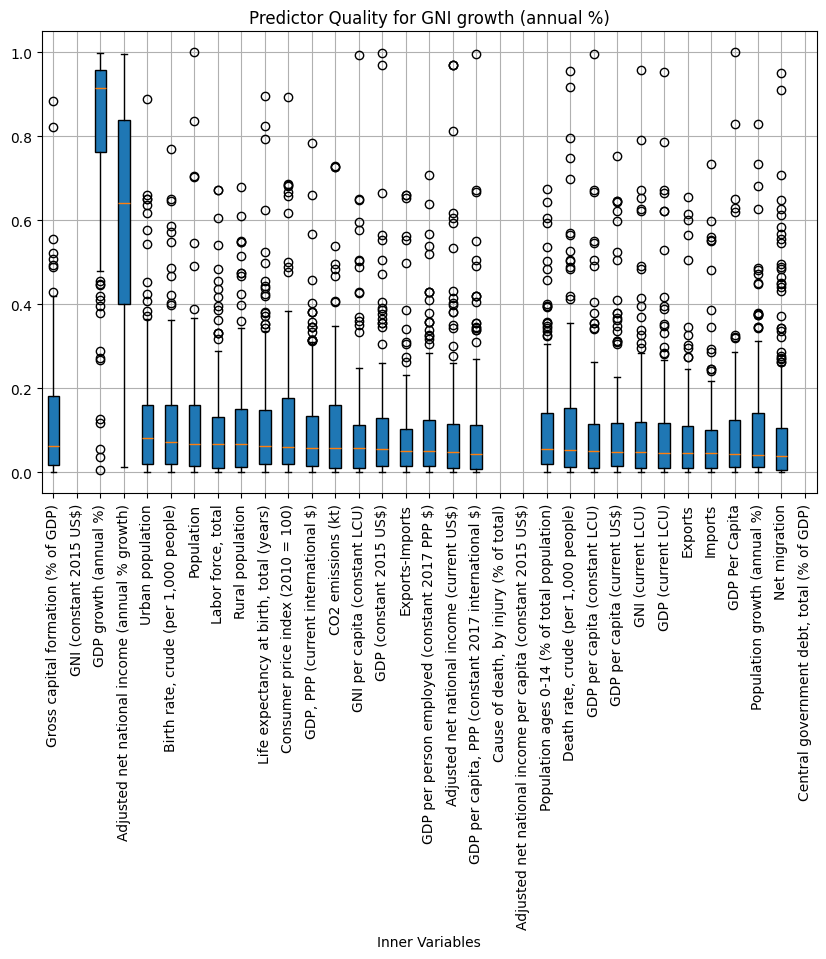

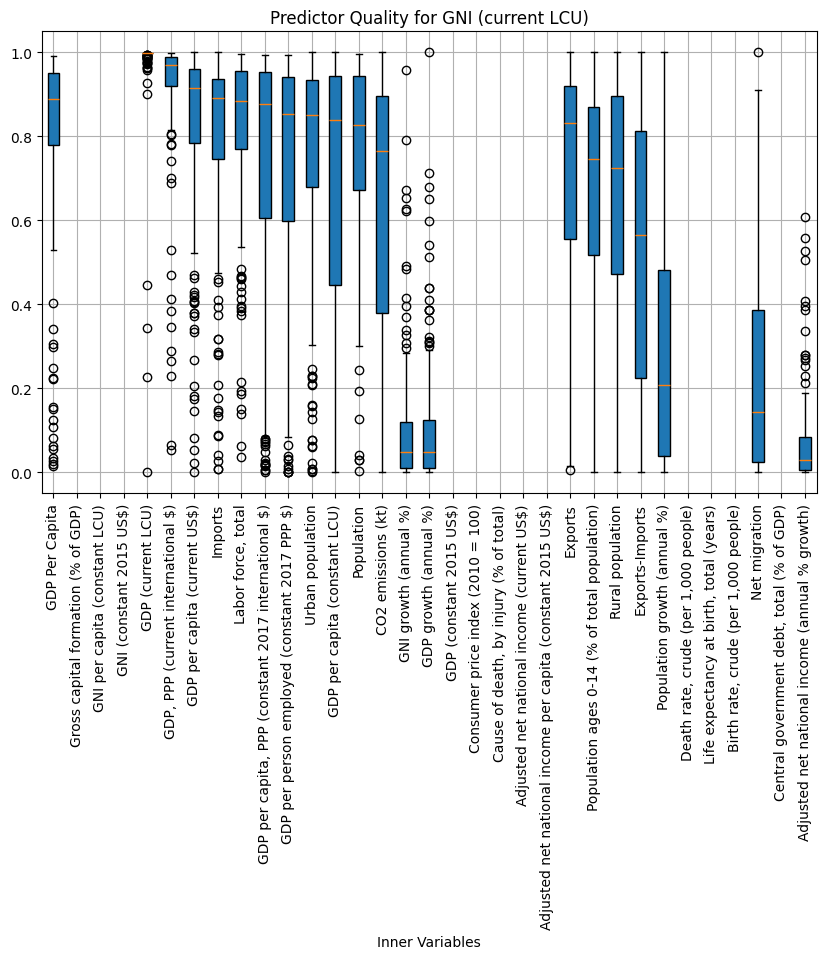

...

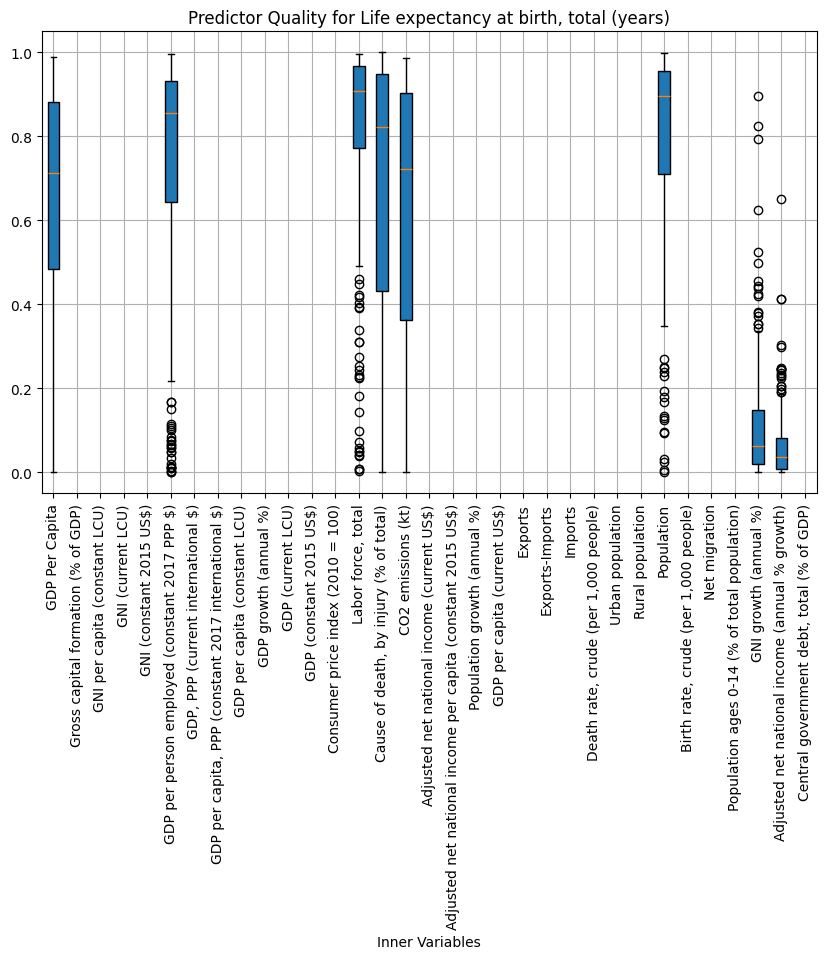

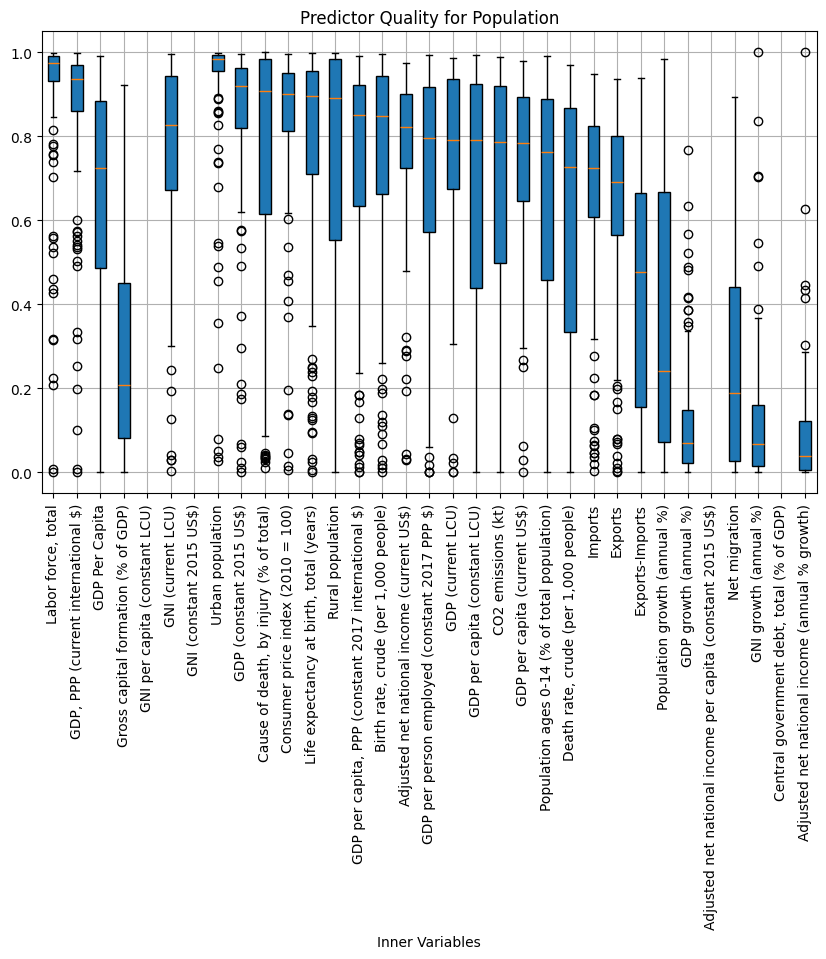

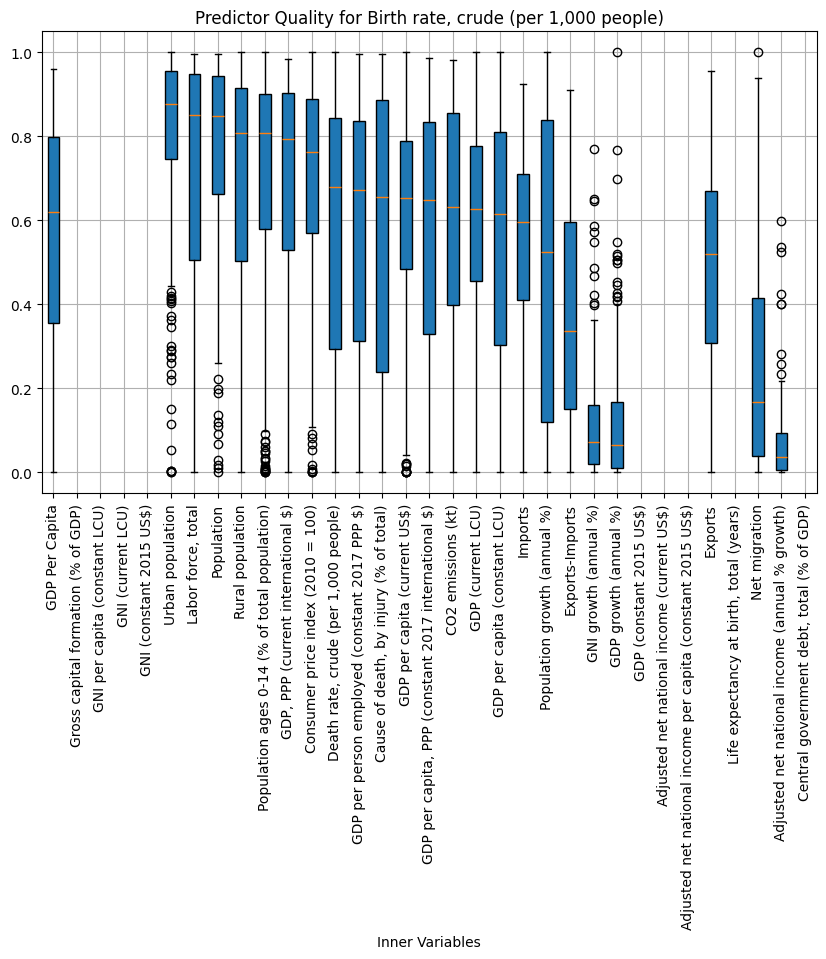

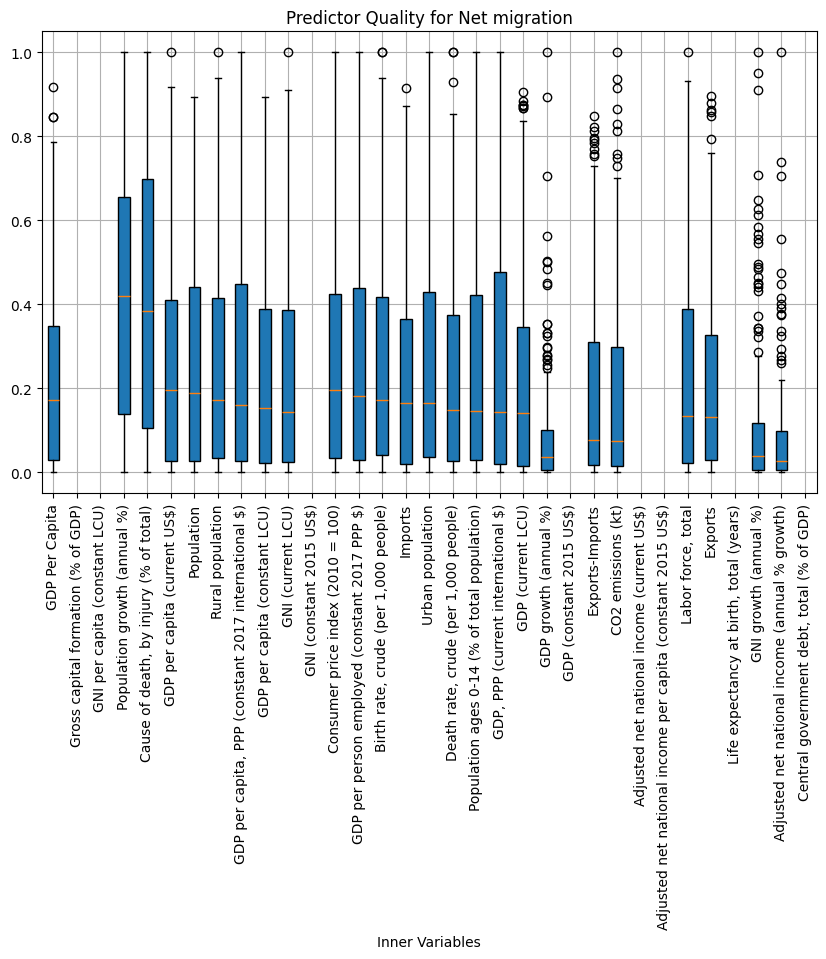

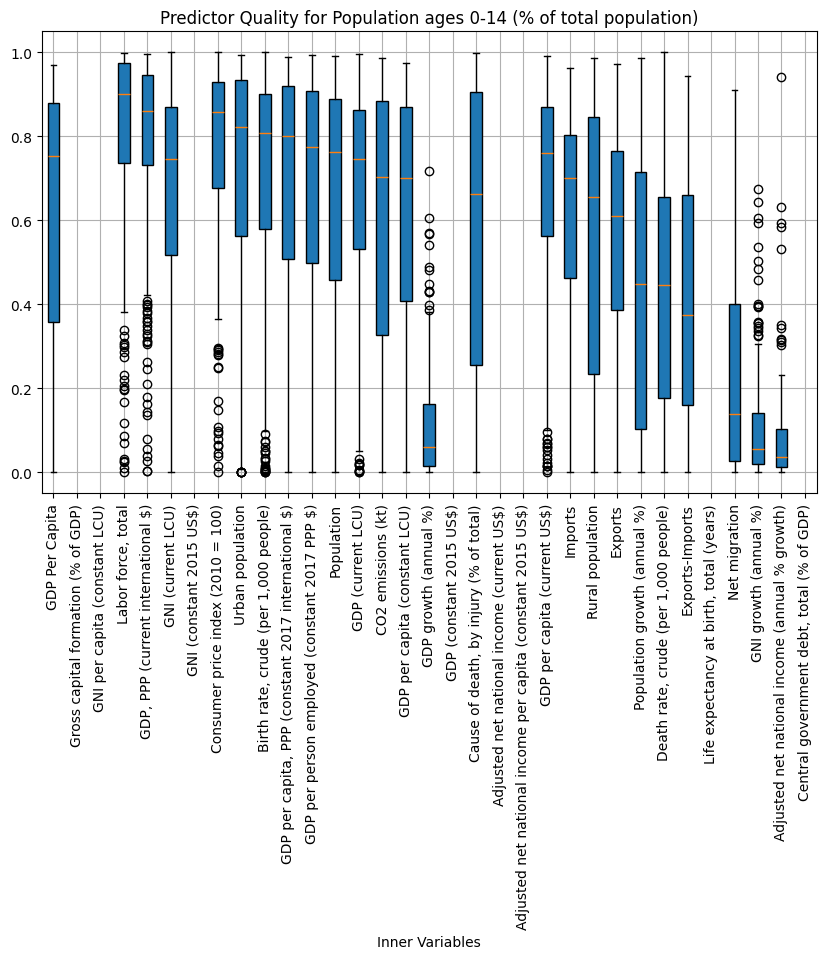

In [27]:
for outer_var, inner_dict in prediction_data.items():
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    plt.title(f'Predictor Quality for {outer_var}')

    # Sort inner dictionary items based on median values
    sorted_inner_dict = dict(sorted(inner_dict.items(), key=lambda x: -np.median(x[1])))

    # Initialize position counter
    position = 1

    # Loop through the sorted subdictionaries
    for inner_var, values in sorted_inner_dict.items():
        plt.boxplot(values, positions=[position], widths=0.5, patch_artist=True)
        position += 1  # Increment position for the next boxplot

    # Customize x-axis ticks and labels
    plt.xticks(range(1, len(sorted_inner_dict) + 1), sorted_inner_dict.keys(), rotation=90)
    plt.xlabel('Inner Variables')

    # Add grid for better readability
    plt.grid(True)

    # Show plot
    plt.show()

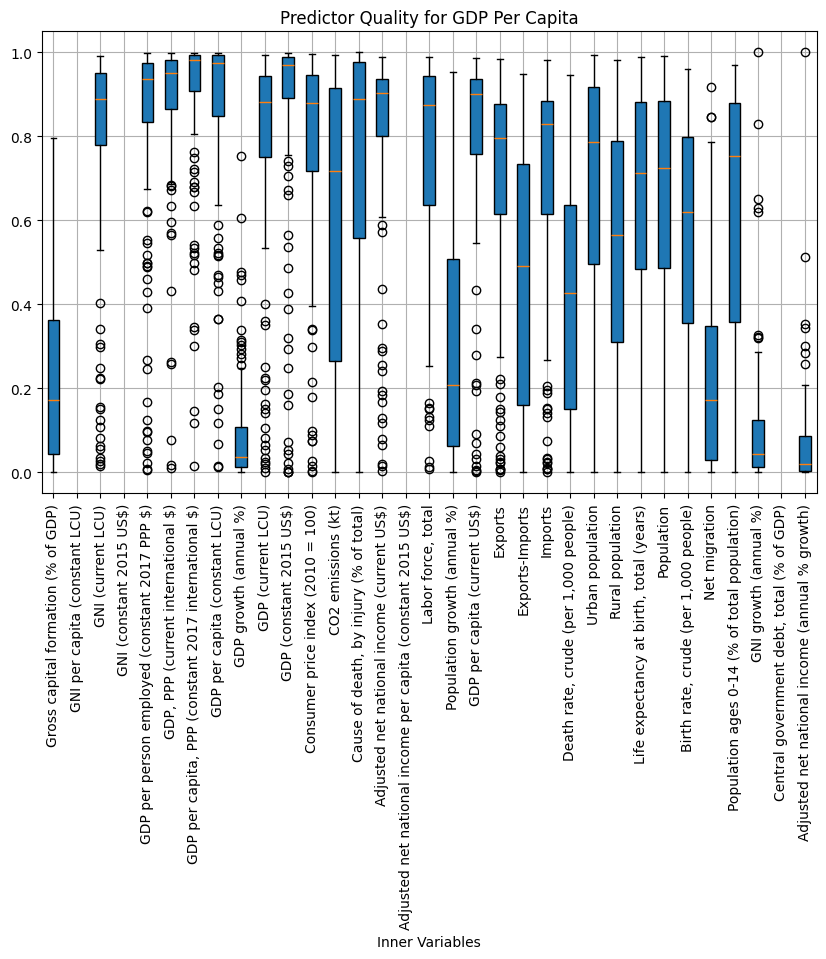

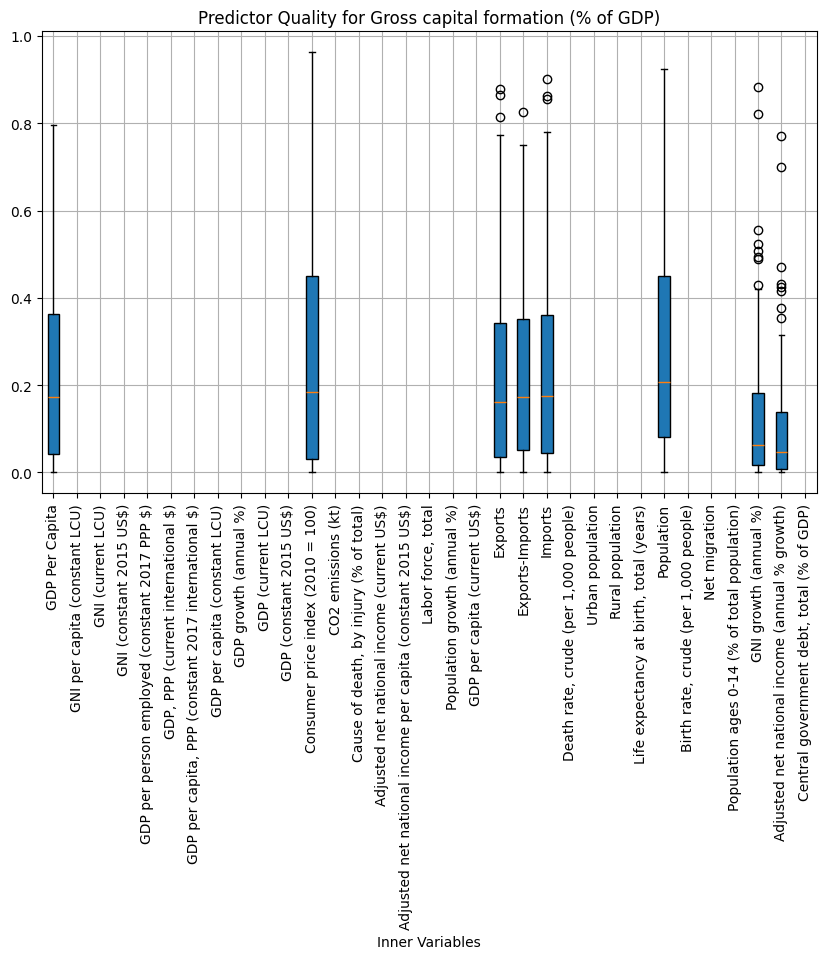

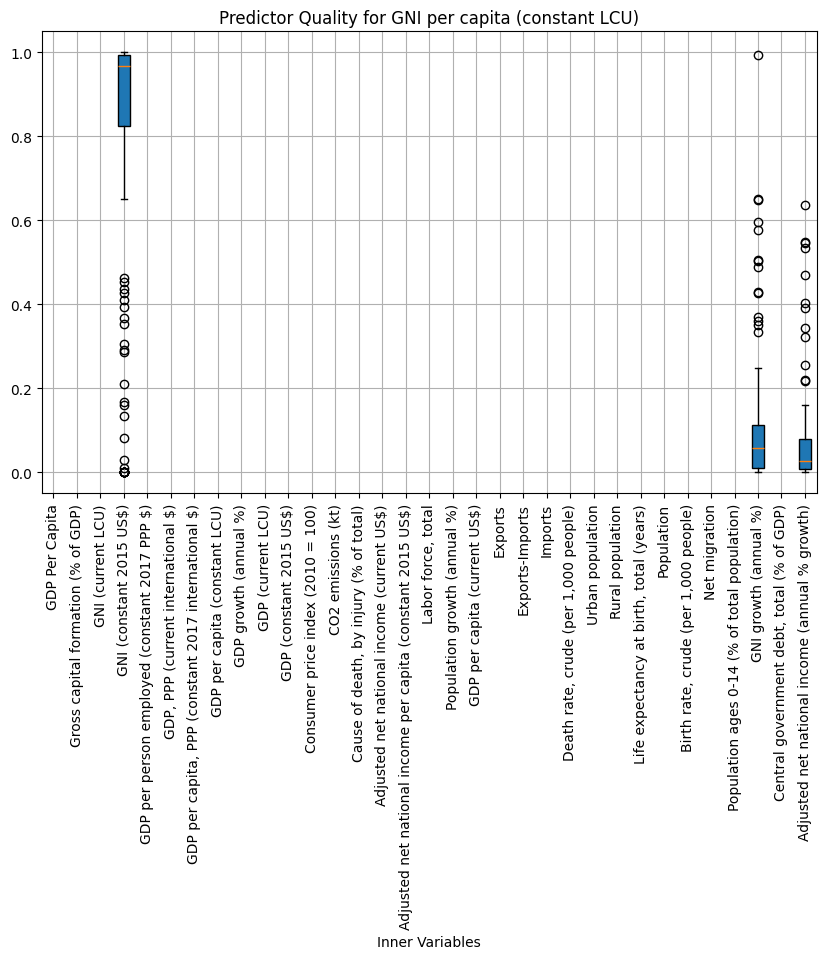

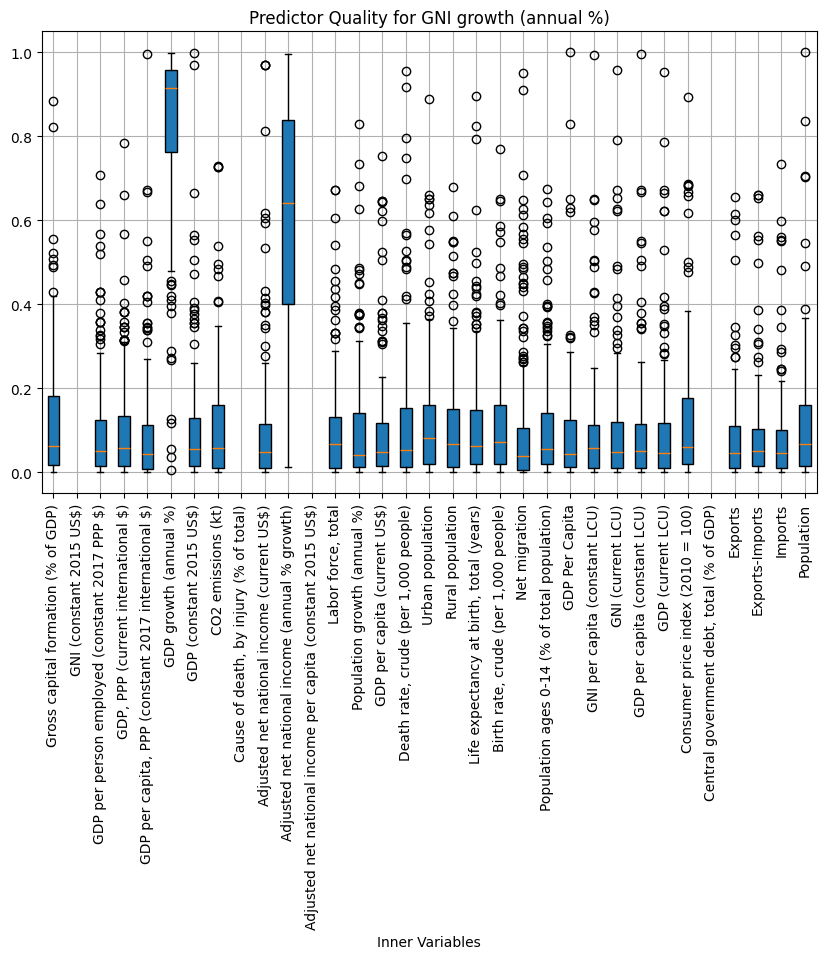

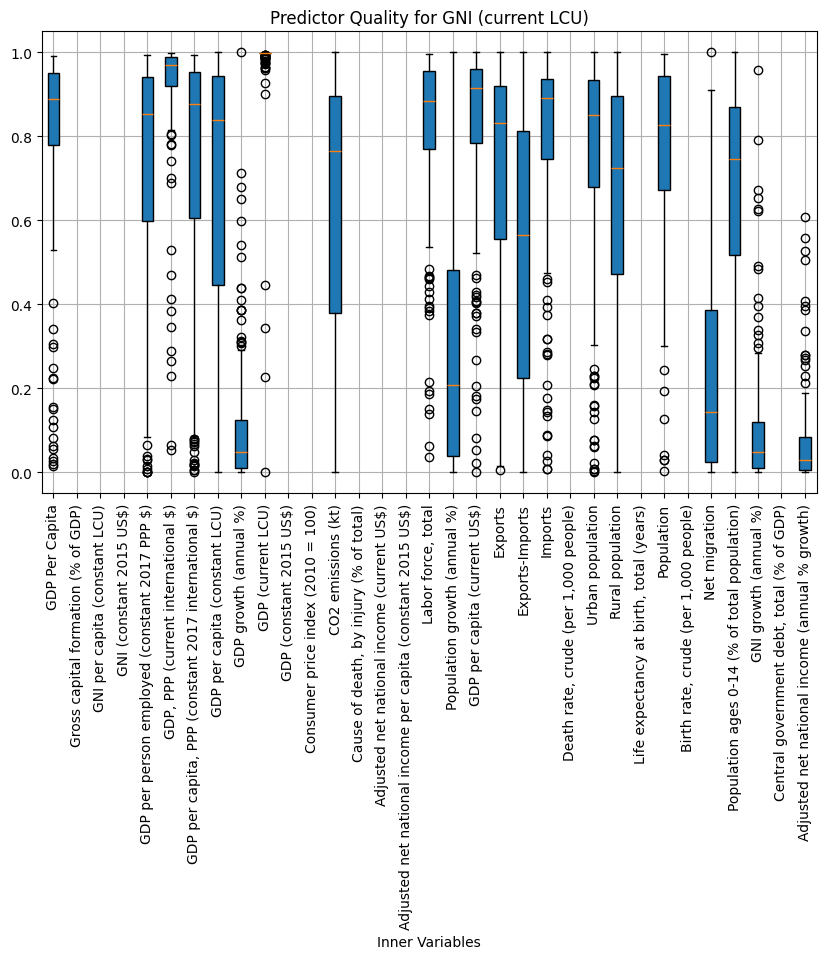

...

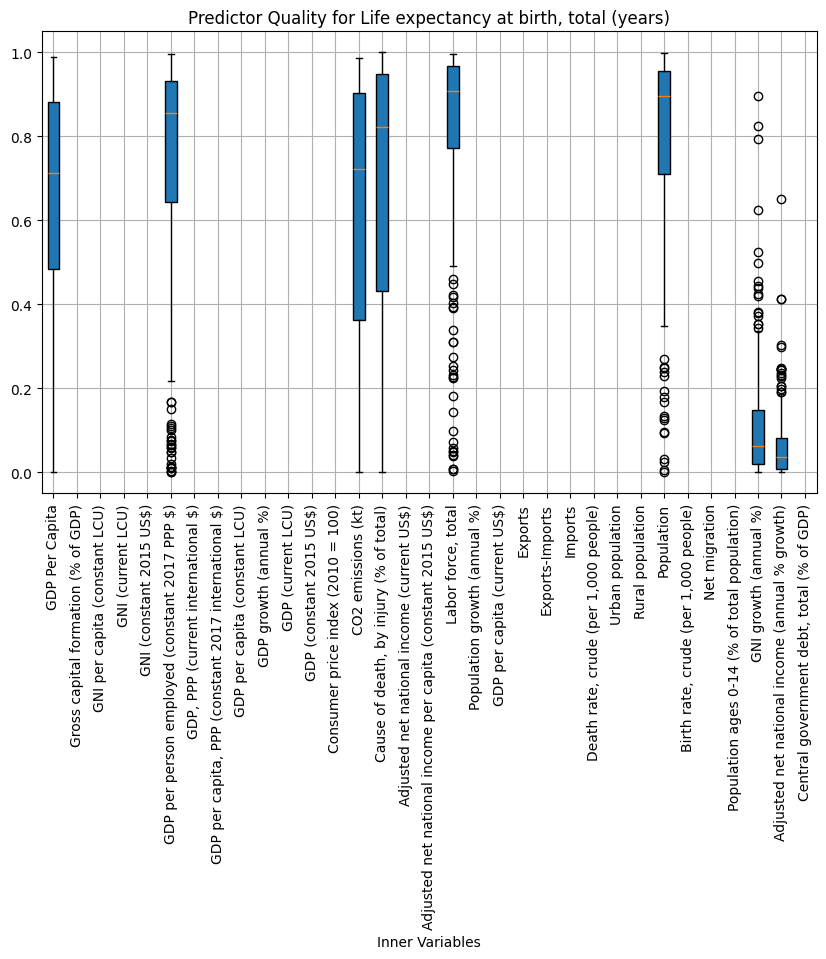

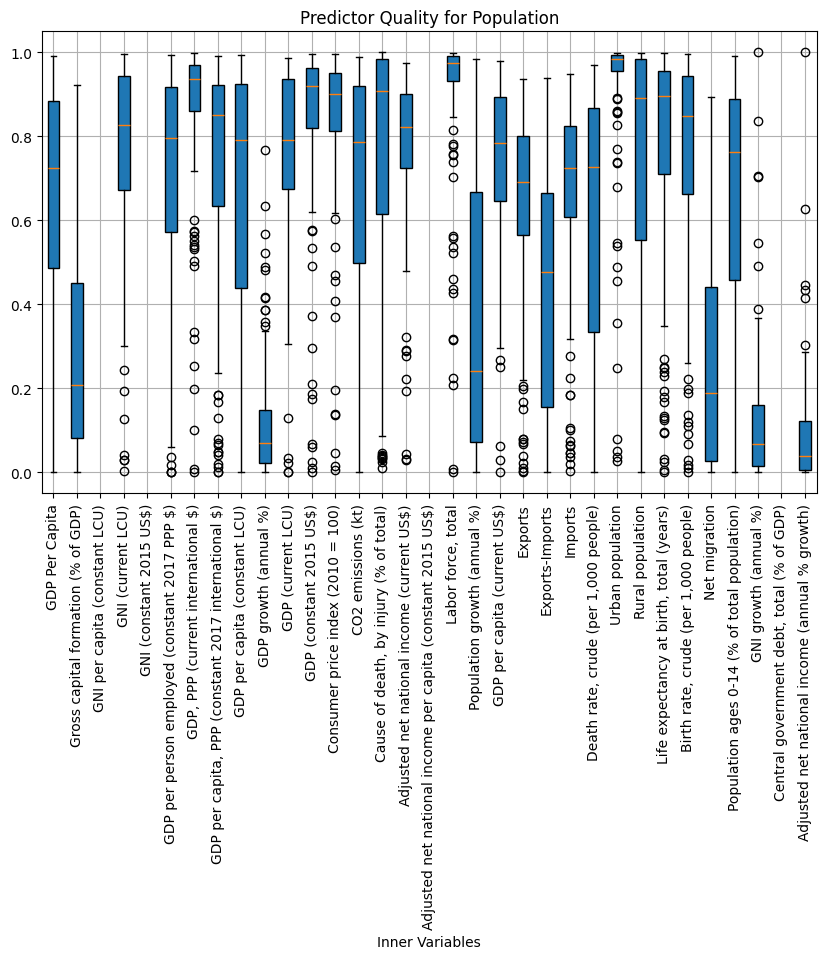

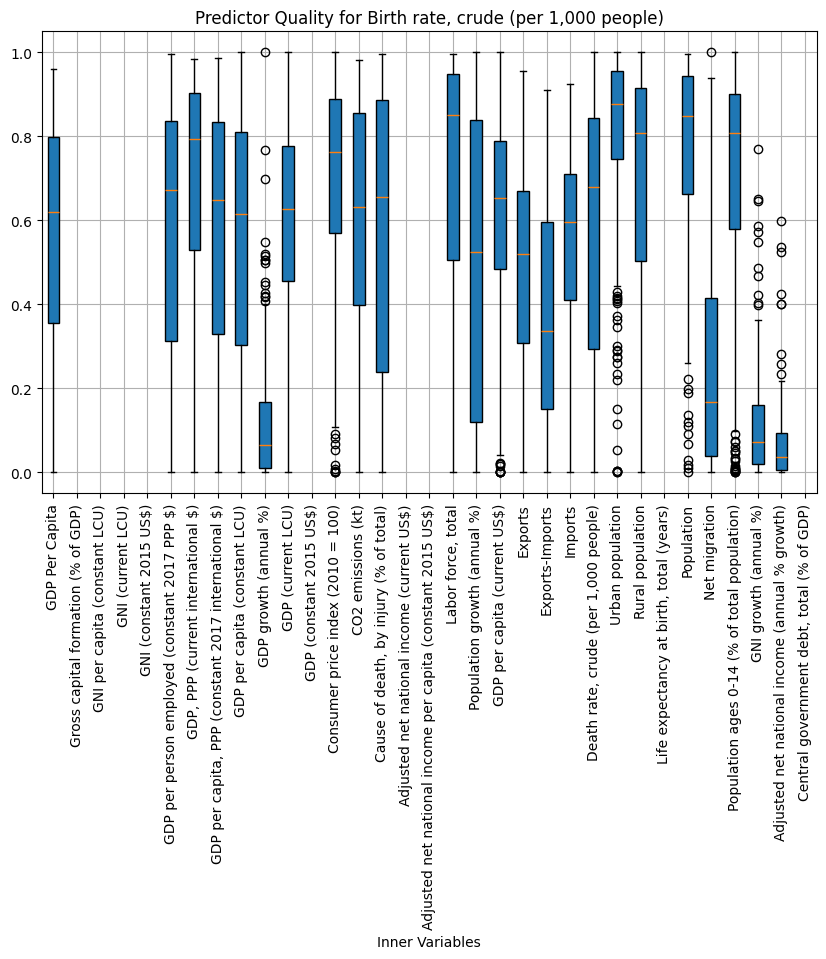

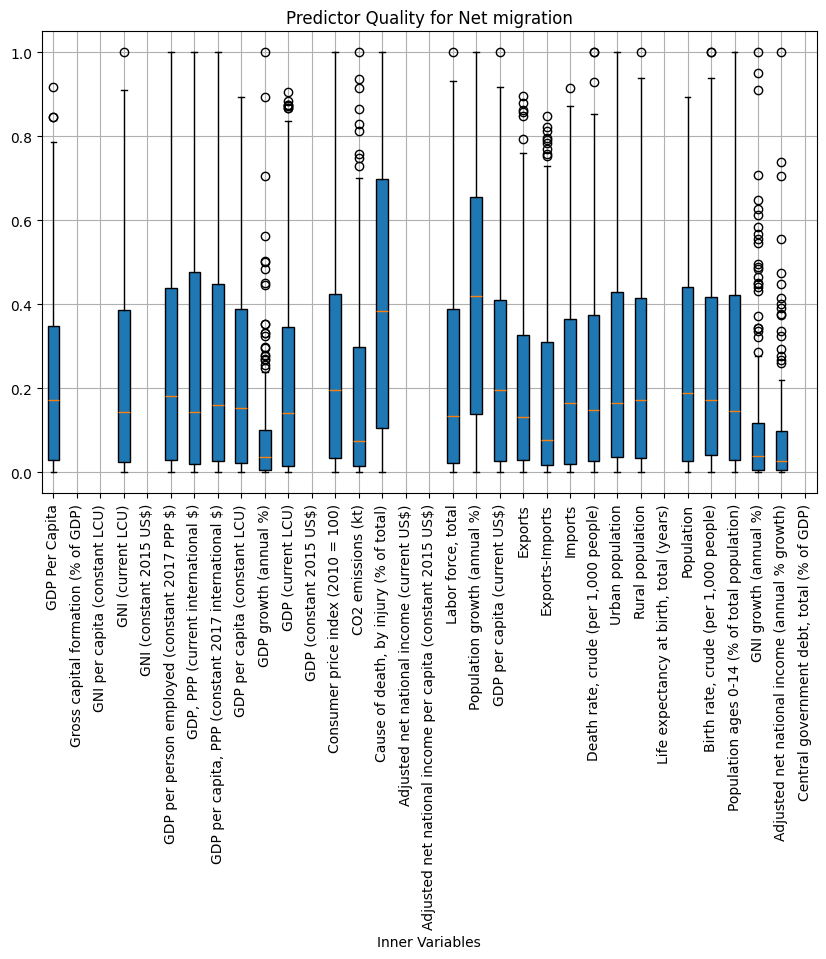

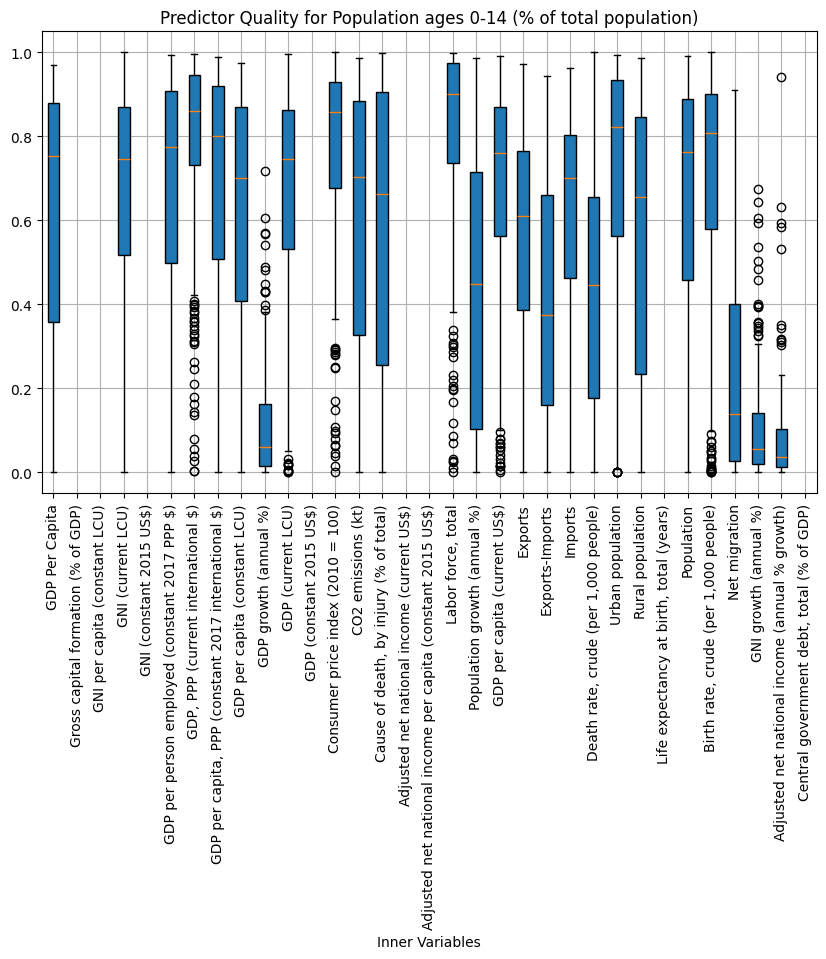

In [28]:
for outer_var, inner_dict in prediction_data.items():
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    plt.title(f'Predictor Quality for {outer_var}')

    # Initialize position counter
    position = 1

    # Loop through the subdictionaries
    for inner_var, values in inner_dict.items():
        plt.boxplot(values, positions=[position], widths=0.5, patch_artist=True)
        position += 1  # Increment position for the next boxplot
        

    # Customize x-axis ticks and labels
    plt.xticks(range(1, len(inner_dict) + 1), inner_dict.keys(), rotation=90)
    plt.xlabel('Inner Variables')

    # Add grid for better readability
    plt.grid(True)

    # Show plot
    plt.show()

## Other

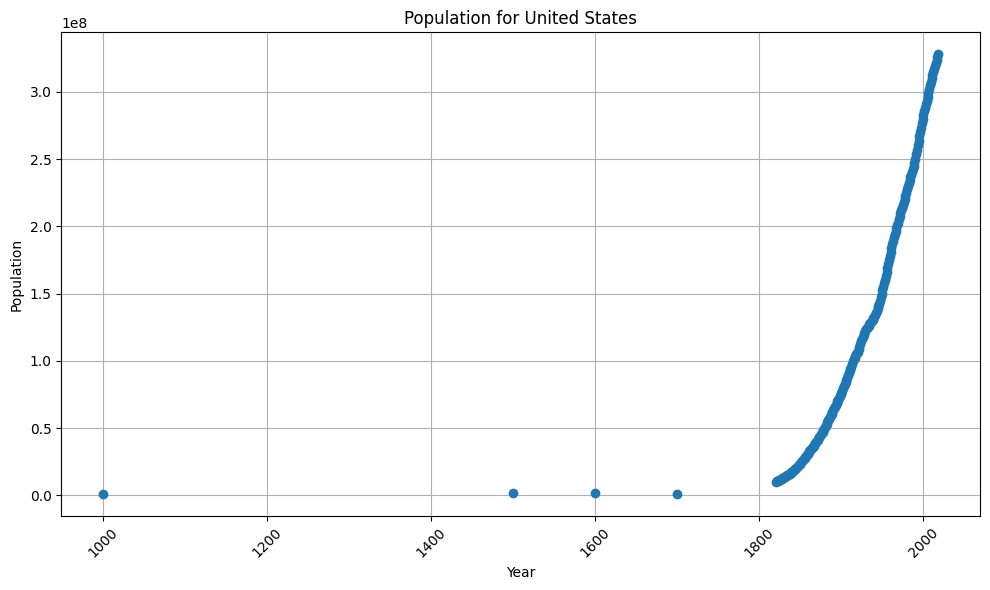

In [84]:
country = "United States"
info = "Population"

sub_frame = df_final[(df_final['country'] == country) & (df_final['info_type'] == info)].iloc[:, 2:]

# Extract years and corresponding GDP per capita values
years = sub_frame.columns[1:-1]  # Exclude 'country', 'info_type', and years beyond 2018
gdppc_values = sub_frame.values[0][1:-1]  # Exclude 'country', 'info_type', and values beyond 2018

# Plot the GDP per capita
plt.figure(figsize=(10, 6))
plt.plot(years, gdppc_values, marker='o', linestyle='-')
plt.title(info + " for " + country)
plt.xlabel('Year')
plt.ylabel(info)
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Bad Past Here:

In [49]:
grouped = dfg.groupby('country')[['year', 'pop']]

dfg.pivot(index='country', columns='year', values=['gdppc', 'pop'])


KeyError: "Columns not found: 'pop', 'year'"

In [ ]:
dft2 = dft.pivot_table(index=['country_english_name', 'year'], columns='trade_flow_desc', values='value', aggfunc='sum').reset_index()

# Calculate the difference between exports and imports
dft2['Exports-Imports'] = dft2['Exports'] - dft2['Imports']

# Stack the DataFrame to add 'Imports', 'Exports', and 'Exports-Imports' as separate rows
dft2 = dft2.melt(id_vars=['country_english_name', 'year'], value_vars=['Imports', 'Exports', 'Exports-Imports'], var_name='trade_flow_desc', value_name='value')

# Sort the DataFrame
dft2 = dft2.sort_values(by=['country_english_name', 'year', 'trade_flow_desc']).reset_index(drop=True)

In [ ]:
df3 = dfg.pivot(index='country', columns='year', values=['gdppc', 'pop'])

print(df3)

melted_df = pd.melt(df3, id_vars='country', value_vars=df3.columns)

# Step 2: Split the column names into variable name and year
melted_df[['variable', 'year']] = melted_df['variable'].apply(lambda x: pd.Series(x.split('_')))

# Step 3: Pivot the DataFrame
final_df = melted_df.pivot(index=['country', 'year'], columns='variable', values='value').reset_index()


print(final_df)


# Flatten the column indices
df3.columns = [f'{col[0]}_{col[1]}' for col in df3.columns]

# Reset the index
df3 = df3.reset_index()

# Melt the DataFrame to combine gdppc and pop into one column
df3 = pd.melt(df3, id_vars='country', var_name='year', value_name='value')

# Sort the DataFrame
df3 = df3.sort_values(by=['country', 'year']).reset_index(drop=True)


                                   gdppc                                     \
year                                1    730  1000 1090 1120 1252 1253 1254   
country                                                                       
Afghanistan                          NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
Albania                              NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
Algeria                              NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
Angola                               NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
Argentina                            NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
...                                  ...  ...  ...  ...  ...  ...  ...  ...   
Venezuela (Bolivarian Republic of)   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
Viet Nam                             NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
Yemen                                NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
Zambia                               NaN  NaN  NaN  

ValueError: value_vars must be a list of tuples when columns are a MultiIndex

In [ ]:
dfg = dfg[dfg["country"].isin(pivot_df["country_english_name"].unique())]

pivot_df = pivot_df[pivot_df["country_english_name"].isin(dfg["country"].unique())]

In [ ]:
dfg["country"].unique()

array(['Afghanistan', 'Angola', 'Albania', 'United Arab Emirates',
       'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan',
       'Burundi', 'Belgium', 'Benin', 'Burkina Faso', 'Bangladesh',
       'Bulgaria', 'Bahrain', 'Bosnia and Herzegovina', 'Belarus',
       'Bolivia (Plurinational State of)', 'Brazil', 'Barbados',
       'Botswana', 'Canada', 'Switzerland', 'Chile', 'China', 'Cameroon',
       'Congo', 'Colombia', 'Comoros', 'Cabo Verde', 'Costa Rica', 'Cuba',
       'Cyprus', 'Germany', 'Djibouti', 'Dominica', 'Denmark',
       'Dominican Republic', 'Algeria', 'Ecuador', 'Egypt', 'Spain',
       'Estonia', 'Ethiopia', 'Finland', 'France', 'Gabon',
       'United Kingdom', 'Georgia', 'Ghana', 'Guinea', 'Gambia',
       'Guinea-Bissau', 'Equatorial Guinea', 'Greece', 'Guatemala',
       'China, Hong Kong SAR', 'Honduras', 'Croatia', 'Haiti', 'Hungary',
       'Indonesia', 'India', 'Ireland', 'Iraq', 'Iceland', 'Israel',
       'Italy', 'Jamaica', 'Jordan', 'Japan', '

In [ ]:
dfg.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20029 entries, 0 to 21681
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   countrycode  20029 non-null  object 
 1   country      20029 non-null  object 
 2   year         20029 non-null  int64  
 3   gdppc        18224 non-null  float64
 4   pop          15620 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 938.9+ KB


In [ ]:
print(dfg.columns)
print(dft2.columns)
years = sorted(list(set(list(dfg["year"].unique()) + list(dft2["year"].unique()))))
countries = dfg["country"].unique()

complete_df = pd.DataFrame(columns=years)
complete_df["country"] = countries

types = ['imports', 'exports', 'Exports-Imports']

# Duplicate each unique country name three times
countries = np.repeat(complete_df['country'].unique(), 3)

# Tile the types array to match the length of countries
types_tiled = np.tile(types, len(complete_df['country'].unique()))

# Create a DataFrame for the new column
new_column_df = pd.DataFrame({'country': countries, 'type': types_tiled})

df_with_new_column = pd.merge(complete_df, new_column_df, on='country')

print(df_with_new_column)

merged_df = pd.merge(df_with_new_column, pivot_df, left_on=['country', 'year'], right_on=['country_english_name', 'trade_flow_desc'], how='left')

# Drop the redundant columns
#merged_df.drop(['country_english_name', 'trade_flow_desc'], axis=1, inplace=True)

print(merged_df)

for count in complete_df["country"].unique():
    for type in types:
        pass

df_gdppc_pivot = dfg.pivot(index='country', columns='year', values='gdppc').add_suffix('_gdppc')

# Pivot the dataframe to have 'year' as columns and 'country' as index for population
df_pop_pivot = dfg.pivot(index='country', columns='year', values='pop').add_suffix('_pop')

# Concatenate the two pivoted dataframes to get a single dataframe
df_final = pd.concat([df_gdppc_pivot, df_pop_pivot], axis=0)

# Sort the index (country names)
df_final.sort_index(inplace=True)

# Reset the index to have country names as a column
df_final.reset_index(inplace=True)



Index(['countrycode', 'country', 'year', 'gdppc', 'pop'], dtype='object')
Index(['country_english_name', 'year', 'trade_flow_desc', 'value'], dtype='object')
       1  730 1000 1090 1120 1252 1253 1254 1255 1256  ... 2015 2016 2017  \
0    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN   
1    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN   
2    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN   
3    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN   
4    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN   
..   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
448  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN   
449  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN   
450  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  NaN   
451  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN  Na

KeyError: 'year'

      countrycode country  year   gdppc    pop
18402         SWE  Sweden     1     NaN  200.0
18403         SWE  Sweden  1000     NaN  400.0
18404         SWE  Sweden  1300  1133.0    NaN
18405         SWE  Sweden  1301  1135.0    NaN
18406         SWE  Sweden  1302  1379.0    NaN


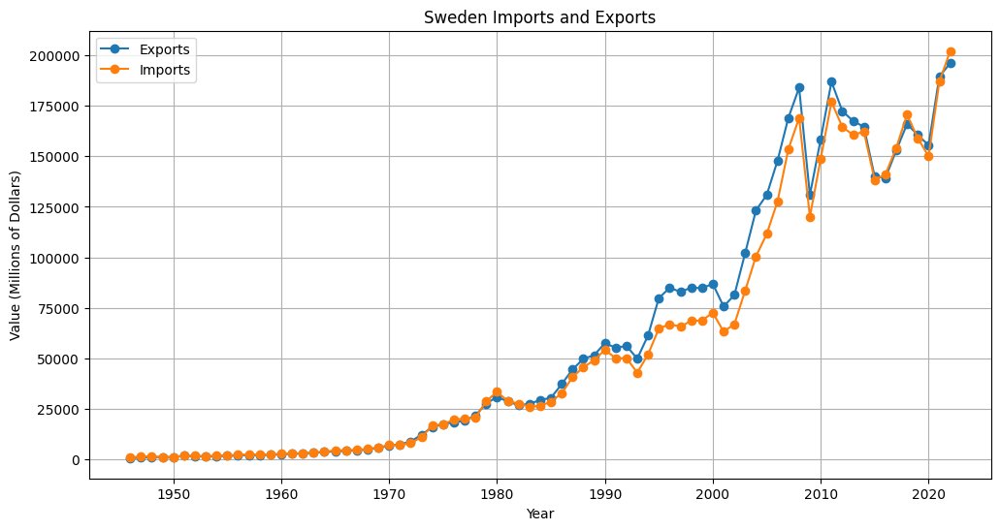

In [ ]:
country = "Sweden"

trade_types = ["X", "M"]  # X for exports, M for imports
dft_unique = dft[dft['country_english_name'] == country]

dfg_unique = dfg[dfg['country'] == country]

print(dfg_unique.head())

plt.figure(figsize=(12, 6))

for i, trade_type in enumerate(trade_types):
    sub_df = dft_unique[dft_unique['trade_flow'] == trade_type]
    grouped_df = sub_df.groupby('year')['value'].sum()
    plt.plot(grouped_df, marker='o', label="Imports" if trade_type == 'M' else "Exports")



plt.title(f'{country} Imports and Exports')
plt.xlabel('Year')
plt.ylabel('Value (Millions of Dollars)')
plt.grid(True)
plt.legend()
plt.show()

ValueError: Could not interpret value `gdppc` for `x`. An entry with this name does not appear in `data`.

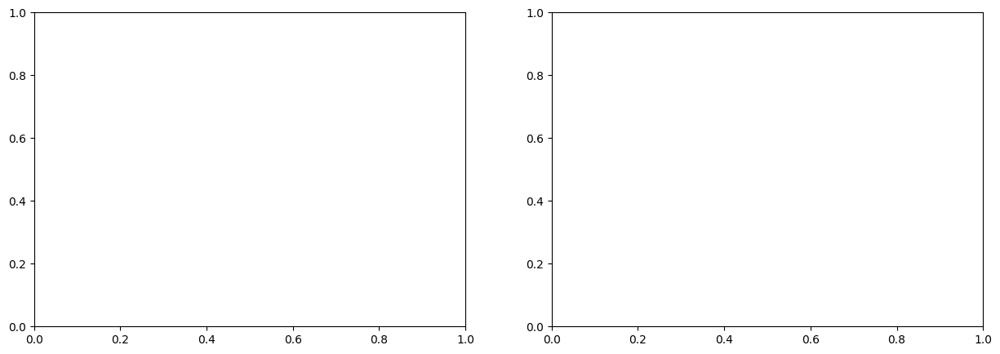

In [ ]:
possible_features = ["gdppc", "pop"]
trade_types = ["X", "M"]  # X for exports, M for imports


# Create 3 axes in 1 row that don't share the y axis
fig, axes = plt.subplots(nrows=1, ncols=len(possible_features), figsize=(15, 5), sharey=False)


dft_unique = dft[dft['country_english_name'] == country]

dfg_unique = dfg[dfg['country'] == country]


for index, feature in enumerate(possible_features):
    sub_df = dft_unique[dft_unique['trade_flow'] == trade_type]
    sns.scatterplot(data=sub_df, x=feature, y="gdppc", ax=axes[index])
    axes[index].set_title(f'Sales vs {feature}')

fig.suptitle("Scatterplots of ", fontsize=16)
fig.tight_layout()

In [ ]:
merged_df = pd.merge(pivot_df, dfg, left_on='country_english_name', right_on='country', how='left')

# Drop the duplicate 'country' column
merged_df.drop('country', axis=1, inplace=True)

merged_df

,country_english_name,trade_flow_desc,1946,1947,1948,1949,1950,1951,1952,1953,...,2017,2018,2019,2020,2021,2022,countrycode,year,gdppc,pop
0,Afghanistan,Exports,47.82,49.7,49.000000,47.000000,53.000000,60.000000,45.000000,47.000000,...,831.859248,875.181037,863.833322,776.722236,734.684908,656.341619,AFG,1820,NaN,3280.00000
1,Afghanistan,Exports,47.82,49.7,49.000000,47.000000,53.000000,60.000000,45.000000,47.000000,...,831.859248,875.181037,863.833322,776.722236,734.684908,656.341619,AFG,1870,NaN,4207.00000
2,Afghanistan,Exports,47.82,49.7,49.000000,47.000000,53.000000,60.000000,45.000000,47.000000,...,831.859248,875.181037,863.833322,776.722236,734.684908,656.341619,AFG,1913,NaN,5730.00000
3,Afghanistan,Exports,47.82,49.7,49.000000,47.000000,53.000000,60.000000,45.000000,47.000000,...,831.859248,875.181037,863.833322,776.722236,734.684908,656.341619,AFG,1950,1156.0000,8150.00000
4,Afghanistan,Exports,47.82,49.7,49.000000,47.000000,53.000000,60.000000,45.000000,47.000000,...,831.859248,875.181037,863.833322,776.722236,734.684908,656.341619,AFG,1951,1170.0000,8284.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60082,Zimbabwe,Imports,NaN,NaN,240.199333,293.999918,164.533554,239.775133,247.458331,217.489939,...,4513.670309,6906.500858,5793.789479,5970.711289,7993.684354,9188.501881,ZWE,2014,1594.0000,13313.99205
60083,Zimbabwe,Imports,NaN,NaN,240.199333,293.999918,164.533554,239.775133,247.458331,217.489939,...,4513.670309,6906.500858,5793.789479,5970.711289,7993.684354,9188.501881,ZWE,2015,1560.0000,13479.13812
60084,Zimbabwe,Imports,NaN,NaN,240.199333,293.999918,164.533554,239.775133,247.458331,217.489939,...,4513.670309,6906.500858,5793.789479,5970.711289,7993.684354,9188.501881,ZWE,2016,1534.0000,13664.79457
60085,Zimbabwe,Imports,NaN,NaN,240.199333,293.999918,164.533554,239.775133,247.458331,217.489939,...,4513.670309,6906.500858,5793.789479,5970.711289,7993.684354,9188.501881,ZWE,2017,1582.3662,13870.26413


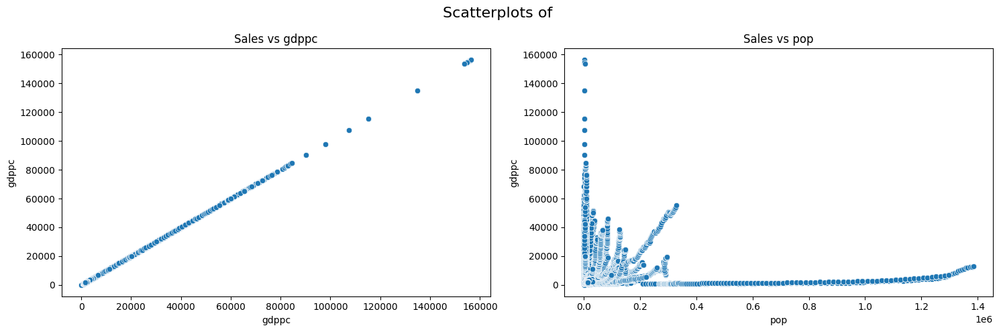

In [ ]:
possible_features = ["gdppc", "pop"]
trade_types = ["X", "M"]  # X for exports, M for imports


# Create 3 axes in 1 row that don't share the y axis
fig, axes = plt.subplots(nrows=1, ncols=len(possible_features), figsize=(15, 5), sharey=False)


dft_unique = dft[dft['country_english_name'] == country]

dfg_unique = dfg[dfg['country'] == country]


for index, feature in enumerate(possible_features):
    sub_df = dft_unique[dft_unique['trade_flow'] == trade_type]
    sns.scatterplot(data=merged_df, x=feature, y="gdppc", ax=axes[index])
    axes[index].set_title(f'Sales vs {feature}')

fig.suptitle("Scatterplots of ", fontsize=16)
fig.tight_layout()

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40222 entries, 0 to 40221
Data columns (total 83 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   country_english_name  40222 non-null  object 
 1   trade_flow_desc       40222 non-null  object 
 2   1946                  28170 non-null  float64
 3   1947                  29667 non-null  float64
 4   1948                  33291 non-null  float64
 5   1949                  31357 non-null  float64
 6   1950                  33142 non-null  float64
 7   1951                  32999 non-null  float64
 8   1952                  33143 non-null  float64
 9   1953                  33539 non-null  float64
 10  1954                  33470 non-null  float64
 11  1955                  33614 non-null  float64
 12  1956                  33470 non-null  float64
 13  1957                  33613 non-null  float64
 14  1958                  33858 non-null  float64
 15  1959               

ValueError: Could not interpret value `exports_2020` for `y`. An entry with this name does not appear in `data`.

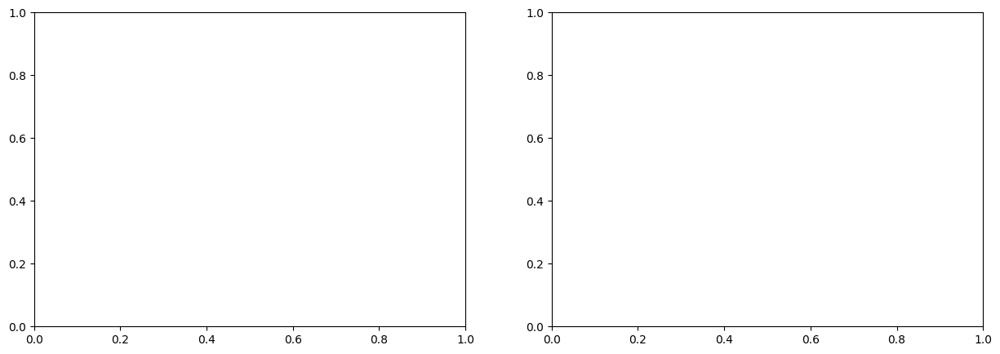

In [ ]:
gdp_column = "gdppc"

# Create a list of possible features (exports and imports)
possible_features = ["Exports", "Imports"]

# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=len(possible_features), figsize=(15, 5), sharey=False)

# Loop through the possible features
for index, feature in enumerate(possible_features):
    # Plot GDP per capita against the selected feature
    sns.scatterplot(data=merged_df, x=gdp_column, y=feature, ax=axes[index])
    axes[index].set_title(f'{feature.capitalize()} vs GDP per Capita')

# Set common title for the whole plot
fig.suptitle("Scatterplots of Exports/Imports against GDP per Capita", fontsize=16)
fig.tight_layout()

# Show the plot
plt.show()